# Importing the Libraries

In [ ]:
import numpy as np
import pandas as pd
pd.options.display.max_rows = 10
pd.options.display.max_columns = 300
import seaborn as sns
from sklearn.model_selection import train_test_split
import matplotlib
%matplotlib inline
import matplotlib.pyplot as plt
import plotly.express as px
import seaborn as sns

!pip install feature_engine
#from feature_engine.encoding import OneHotEncoder
from sklearn.preprocessing import OrdinalEncoder
from plotly.subplots import make_subplots
from plotly import graph_objects as go

from sklearn.preprocessing import OneHotEncoder
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import train_test_split

from sklearn.metrics import roc_auc_score
from sklearn.metrics import f1_score
from sklearn.metrics import classification_report
from sklearn.metrics import accuracy_score
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score

from xgboost import XGBClassifier
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier
from sklearn.tree import DecisionTreeClassifier, ExtraTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import RidgeClassifier
from sklearn import svm, tree, linear_model, neighbors, naive_bayes, ensemble
from sklearn.linear_model import LogisticRegression, SGDClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.svm import SVC

import warnings
warnings.filterwarnings("ignore")

from sklearn.impute import SimpleImputer
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer


Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 276 kB 4.0 MB/s 
     |████████████████████████████████| 9.8 MB 39.1 MB/s 
  Attempting uninstall: statsmodels
    Found existing installation: statsmodels 0.10.2
    Uninstalling statsmodels-0.10.2:
      Successfully uninstalled statsmodels-0.10.2


# Import Data

In [ ]:
# To Import Data from google drive (authentication needed)
from google.colab import drive 
drive.mount('/content/gdrive')

pd.set_option('display.max_columns',500)
Data=pd.read_csv('gdrive/My Drive/TMLC Guided Projects/Project_1/RTA Dataset.csv')

Mounted at /content/gdrive


In [ ]:
Data

,Time,Day_of_week,Age_band_of_driver,Sex_of_driver,Educational_level,Vehicle_driver_relation,Driving_experience,Type_of_vehicle,Owner_of_vehicle,Service_year_of_vehicle,Defect_of_vehicle,Area_accident_occured,Lanes_or_Medians,Road_allignment,Types_of_Junction,Road_surface_type,Road_surface_conditions,Light_conditions,Weather_conditions,Type_of_collision,Number_of_vehicles_involved,Number_of_casualties,Vehicle_movement,Casualty_class,Sex_of_casualty,Age_band_of_casualty,Casualty_severity,Work_of_casuality,Fitness_of_casuality,Pedestrian_movement,Cause_of_accident,Accident_severity
0,17:02:00,Monday,18-30,Male,Above high school,Employee,1-2yr,Automobile,Owner,Above 10yr,No defect,Residential areas,NaN,Tangent road with flat terrain,No junction,Asphalt roads,Dry,Daylight,Normal,Collision with roadside-parked vehicles,2,2,Going straight,na,na,na,na,NaN,NaN,Not a Pedestrian,Moving Backward,Slight Injury
1,17:02:00,Monday,31-50,Male,Junior high school,Employee,Above 10yr,Public (> 45 seats),Owner,5-10yrs,No defect,Office areas,Undivided Two way,Tangent road with flat terrain,No junction,Asphalt roads,Dry,Daylight,Normal,Vehicle with vehicle collision,2,2,Going straight,na,na,na,na,NaN,NaN,Not a Pedestrian,Overtaking,Slight Injury
2,17:02:00,Monday,18-30,Male,Junior high school,Employee,1-2yr,Lorry (41?100Q),Owner,NaN,No defect,Recreational areas,other,NaN,No junction,Asphalt roads,Dry,Daylight,Normal,Collision with roadside objects,2,2,Going straight,Driver or rider,Male,31-50,3,Driver,NaN,Not a Pedestrian,Changing lane to the left,Serious Injury
3,1:06:00,Sunday,18-30,Male,Junior high school,Employee,5-10yr,Public (> 45 seats),Governmental,NaN,No defect,Office areas,other,Tangent road with mild grade and flat terrain,Y Shape,Earth roads,Dry,Darkness - lights lit,Normal,Vehicle with vehicle collision,2,2,Going straight,Pedestrian,Female,18-30,3,Driver,Normal,Not a Pedestrian,Changing lane to the right,Slight Injury
4,1:06:00,Sunday,18-30,Male,Junior high school,Employee,2-5yr,NaN,Owner,5-10yrs,No defect,Industrial areas,other,Tangent road with flat terrain,Y Shape,Asphalt roads,Dry,Darkness - lights lit,Normal,Vehicle with vehicle collision,2,2,Going straight,na,na,na,na,NaN,NaN,Not a Pedestrian,Overtaking,Slight Injury
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12311,16:15:00,Wednesday,31-50,Male,NaN,Employee,2-5yr,Lorry (11?40Q),Owner,NaN,No defect,Outside rural areas,Undivided Two way,Tangent road with flat terrain,No junction,Asphalt roads,Dry,Daylight,Normal,Vehicle with vehicle collision,2,1,Going straight,na,na,na,na,Driver,Normal,Not a Pedestrian,No distancing,Slight Injury
12312,18:00:00,Sunday,Unknown,Male,Elementary school,Employee,5-10yr,Automobile,Owner,NaN,No defect,Outside rural areas,Two-way (divided with broken lines road marking),Escarpments,No junction,Asphalt roads,Dry,Daylight,Normal,Vehicle with vehicle collision,2,1,Other,na,na,na,na,Driver,Normal,Not a Pedestrian,No distancing,Slight Injury
12313,13:55:00,Sunday,Over 51,Male,Junior high school,Employee,5-10yr,Bajaj,Owner,2-5yrs,No defect,Outside rural areas,Two-way (divided with broken lines road marking),Tangent road with mountainous terrain and,No junction,Asphalt roads,Dry,Daylight,Normal,Vehicle with vehicle collision,1,1,Other,Driver or rider,Male,31-50,3,Driver,Normal,Not a Pedestrian,Changing lane to the right,Serious Injury
12314,13:55:00,Sunday,18-30,Female,Junior high school,Employee,Above 10yr,Lorry (41?100Q),Owner,2-5yrs,No defect,Office areas,Undivided Two way,Tangent road with mountainous terrain and,No junction,Asphalt roads,Dry,Darkness - lights lit,Normal,Vehicle with vehicle collision,2,1,Other,na,na,na,na,Driver,Normal,Not a Pedestrian,Driving under the influence of drugs,Slight Injury


# EDA

In [ ]:
pd.crosstab(index=Data['Accident_severity'], columns=Data['Type_of_collision'])

Type_of_collision,Collision with animals,Collision with pedestrians,Collision with roadside objects,Collision with roadside-parked vehicles,Fall from vehicles,Other,Rollover,Unknown,Vehicle with vehicle collision,With Train
Accident_severity,,,,,,,,,,
Fatal injury,2,22,24,0,0,0,4,0,104,0
Serious Injury,27,141,272,5,4,3,54,1,1203,2
Slight Injury,142,733,1490,49,30,23,339,13,7467,7


In [ ]:
pd.crosstab(index=Data['Accident_severity'], columns=Data['Pedestrian_movement'])

Pedestrian_movement,Crossing from driver's nearside,Crossing from nearside - masked by parked or statioNot a Pedestrianry vehicle,Crossing from offside - masked by parked or statioNot a Pedestrianry vehicle,"In carriageway, statioNot a Pedestrianry - not crossing (standing or playing)","In carriageway, statioNot a Pedestrianry - not crossing (standing or playing) - masked by parked or statioNot a Pedestrianry vehicle",Not a Pedestrian,Unknown or other,"Walking along in carriageway, back to traffic","Walking along in carriageway, facing traffic"
Accident_severity,,,,,,,,,
Fatal injury,1,7,1,0,0,142,7,0,0
Serious Injury,28,51,10,5,0,1606,40,3,0
Slight Injury,111,279,61,41,13,9642,246,15,7


In [ ]:
pd.crosstab(index=Data['Accident_severity'], columns=Data['Cause_of_accident'])

Cause_of_accident,Changing lane to the left,Changing lane to the right,Driving at high speed,Driving carelessly,Driving to the left,Driving under the influence of drugs,Drunk driving,Getting off the vehicle improperly,Improper parking,Moving Backward,No distancing,No priority to pedestrian,No priority to vehicle,Other,Overloading,Overspeed,Overtaking,Overturning,Turnover,Unknown
Accident_severity,,,,,,,,,,,,,,,,,,,,
Fatal injury,16,23,2,22,4,5,0,3,1,26,20,5,13,7,2,1,4,2,2,0
Serious Injury,206,260,31,209,53,46,3,29,2,162,303,95,149,64,10,15,75,23,6,2
Slight Injury,1251,1525,141,1171,227,289,24,165,22,949,1940,621,1045,385,47,45,351,124,70,23


In [ ]:
pd.crosstab(index=Data['Accident_severity'], columns=Data['Road_allignment'])

Road_allignment,Escarpments,Gentle horizontal curve,Sharp reverse curve,Steep grade downward with mountainous terrain,Steep grade upward with mountainous terrain,Tangent road with flat terrain,Tangent road with mild grade and flat terrain,Tangent road with mountainous terrain and,Tangent road with rolling terrain
Accident_severity,,,,,,,,,
Fatal injury,1,3,0,4,1,140,2,4,1
Serious Injury,14,20,9,63,5,1466,77,61,6
Slight Injury,98,140,48,362,13,8853,422,331,30


In [ ]:
pd.crosstab(index=Data['Accident_severity'], columns=Data['Lanes_or_Medians'])

Lanes_or_Medians,Double carriageway (median),One way,Two-way (divided with broken lines road marking),Two-way (divided with solid lines road marking),Undivided Two way,Unknown,other
Accident_severity,,,,,,,
Fatal injury,7,12,49,1,62,0,22
Serious Injury,132,114,656,21,524,6,242
Slight Injury,881,719,3706,120,3210,51,1396


In [ ]:
df_temp = Data[['Time','Area_accident_occured','Number_of_casualties','Accident_severity']]
df_temp['Time'] = pd.to_datetime( Data['Time'] )
fig = px.scatter(df_temp, x="Time", y="Area_accident_occured",  size="Number_of_casualties", color="Accident_severity", size_max=30)
fig.update_layout( height=1000 )
fig.show()

In [ ]:
Data.describe(include=[object])

,Time,Day_of_week,Age_band_of_driver,Sex_of_driver,Educational_level,Vehicle_driver_relation,Driving_experience,Type_of_vehicle,Owner_of_vehicle,Service_year_of_vehicle,Defect_of_vehicle,Area_accident_occured,Lanes_or_Medians,Road_allignment,Types_of_Junction,Road_surface_type,Road_surface_conditions,Light_conditions,Weather_conditions,Type_of_collision,Vehicle_movement,Casualty_class,Sex_of_casualty,Age_band_of_casualty,Casualty_severity,Work_of_casuality,Fitness_of_casuality,Pedestrian_movement,Cause_of_accident,Accident_severity
count,12316,12316,12316,12316,11575,11737,11487,11366,11834,8388,7889,12077,11931,12174,11429,12144,12316,12316,12316,12161,12008,12316,12316,12316,12316,9118,9681,12316,12316,12316
unique,1074,7,5,3,7,4,7,17,4,6,3,14,7,9,8,5,4,4,9,10,13,4,3,6,4,7,5,9,20,3
top,15:30:00,Friday,18-30,Male,Junior high school,Employee,5-10yr,Automobile,Owner,Unknown,No defect,Other,Two-way (divided with broken lines road marking),Tangent road with flat terrain,Y Shape,Asphalt roads,Dry,Daylight,Normal,Vehicle with vehicle collision,Going straight,Driver or rider,Male,na,3,Driver,Normal,Not a Pedestrian,No distancing,Slight Injury
freq,120,2041,4271,11437,7619,9627,3363,3205,10459,2883,7777,3819,4411,10459,4543,11296,9340,8798,10063,8774,8158,4944,5253,4443,7076,5903,9608,11390,2263,10415


In [ ]:
columns_names = ['Day_of_week','Sex_of_driver', 'Educational_level', 'Vehicle_driver_relation', 'Driving_experience', 'Type_of_vehicle' ,'Owner_of_vehicle', 'Service_year_of_vehicle',
 'Defect_of_vehicle', 'Area_accident_occured', 'Types_of_Junction', 'Road_surface_type', 'Road_surface_conditions', 'Light_conditions', 'Weather_conditions', 
  'Vehicle_movement',	'Casualty_class'	,'Sex_of_casualty', 'Cause_of_accident']

for feature in columns_names:
  df_temp = Data[['Accident_severity',feature]]
  df_temp.dropna( axis=0, inplace=True )
  fig = px.histogram(df_temp, x="Accident_severity", color=feature, barmode="group",  height=500).update_xaxes(categoryorder='total ascending')
  # fig = px.histogram(df_temp, x="Accident_severity", color=feature, barmode="overlay",  height=500).update_xaxes(categoryorder='total ascending') 
  fig.show()

## Auto-EDA

In [ ]:
# !pip install autoviz
# from autoviz.AutoViz_Class import AutoViz_Class
# AV = AutoViz_Class()

In [ ]:
# AV.AutoViz( 'gdrive/My Drive/TMLC Guided Projects/Project_1/RTA Dataset.csv', header=0, verbose=0, lowess=False, chart_format='svg',max_rows_analyzed=150000,max_cols_analyzed=30)

## Checking Target Feature

In [ ]:
Data_Target = Data[['Accident_severity']]
Data.drop( columns=['Accident_severity'], inplace=True )

In [ ]:
Data_Target['Accident_severity'].unique()

array(['Slight Injury', 'Serious Injury', 'Fatal injury'], dtype=object)

Accident_severity
Slight Injury        10415
Serious Injury        1743
Fatal injury           158
dtype: int64
-----------------------------


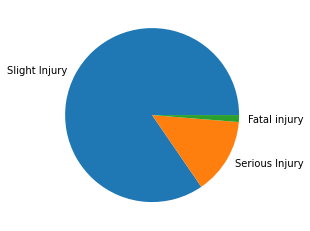

In [ ]:
Slight_Injury_counts = Data_Target.value_counts()['Slight Injury']
Serious_Injury_counts = Data_Target.value_counts()['Serious Injury']
Fatal_injury_counts = Data_Target.value_counts()['Fatal injury']
plt.pie( [Slight_Injury_counts, Serious_Injury_counts, Fatal_injury_counts  ], labels=[ 'Slight Injury' ,'Serious Injury','Fatal injury'] )
print( Data_Target.value_counts() )
print('-----------------------------')

# Data Pre-Processing

 Target Feature has Imbalanced Distribution

---



In [ ]:
def unique_missing( df ):  
  for column in df.columns.values:
    print( "Feature:- ", column )
    print("Unique Values:-", list( df[column].unique() ) )
    print('Percentage of Missing Values:- ', df[column].isnull().sum()/df[column].shape[0]*100 )
    print("--------------------------------------------------------------")
    print("\n")

# unique_missing(Data)

In [ ]:
def plot_histograms( df ):
  i=0
  fig = make_subplots( rows=1, cols=df.shape[1],subplot_titles=df.columns.values )
  for feature in df.columns.values:
    fig.add_trace( go.Histogram( x=df[feature], name=feature), row=1,col=i+1 )
    i = i+1

  no_of_features = len(df.columns.values)
  fig.update_layout( bargap=0.2, width= no_of_features*800 )
  fig.show()
  return

Step 1. Plot histograms <br>
Step 2. Impute Missing <br>
Step 3. Encoding <br>

In [ ]:
ordinal_feature_names = ['Day_of_week', 'Age_band_of_driver','Educational_level', 'Driving_experience', 'Service_year_of_vehicle','Defect_of_vehicle','Light_conditions', 'Age_band_of_casualty']

nominal_feature_names =  [ 'Sex_of_driver', 'Vehicle_driver_relation', 'Type_of_vehicle', 'Owner_of_vehicle', 'Area_accident_occured', 'Lanes_or_Medians', 'Road_allignment', 'Types_of_Junction', 'Road_surface_type',
                            'Road_surface_conditions', 'Weather_conditions', 'Type_of_collision', 'Vehicle_movement', 'Casualty_class', 'Sex_of_casualty','Work_of_casuality','Fitness_of_casuality','Pedestrian_movement',
                            'Cause_of_accident']
date_time_feature_names = ['Time']
numerical_feature_name = ['Number_of_vehicles_involved','Number_of_casualties','Casualty_severity']

##  Numerical Features

In [ ]:
Data['Casualty_severity'].replace(to_replace=['na'], value=np.nan, inplace=True )
Data['Casualty_severity'].replace(to_replace=['1'], value=1, inplace=True )
Data['Casualty_severity'].replace(to_replace=['2'], value=2, inplace=True )
Data['Casualty_severity'].replace(to_replace=['3'], value=3, inplace=True )

In [ ]:
unique_missing( Data[numerical_feature_name] )
plot_histograms( Data[numerical_feature_name] )

Feature:-  Number_of_vehicles_involved
Unique Values:- [2, 1, 3, 6, 4, 7]
Percentage of Missing Values:-  0.0
--------------------------------------------------------------


Feature:-  Number_of_casualties
Unique Values:- [2, 1, 3, 4, 6, 5, 8, 7]
Percentage of Missing Values:-  0.0
--------------------------------------------------------------


Feature:-  Casualty_severity
Unique Values:- [nan, 3.0, 2.0, 1.0]
Percentage of Missing Values:-  36.075024358557975
--------------------------------------------------------------




In [ ]:
# Contains large number of missing values
# Data.drop( columns=['Casualty_severity'], inplace=True ) # Marked for Review
numerical_feature_name = list( set(numerical_feature_name) - set( ['Casualty_severity'] ) )

## DateTime Features

In [ ]:
def convert_Time_into_minutes(df):
  temp_df = df['Time'].str.split(":",expand=True)
  temp_df.rename( columns={0:'hour',1:'minutes',2:'seconds'}, inplace=True )
  temp_df = temp_df.astype(int)
  return temp_df['hour']*60 + temp_df['minutes']
Data['Time'] = convert_Time_into_minutes(Data)

## Ordinal features

In [ ]:
Data['Age_band_of_driver'].replace(to_replace=['Unknown','unknown'], value=np.nan, inplace=True )
Data['Educational_level'].replace(to_replace=['Unknown','unknown'], value=np.nan, inplace=True )
Data['Driving_experience'].replace(to_replace=['Unknown','unknown'], value=np.nan, inplace=True )
Data['Service_year_of_vehicle'].replace(to_replace=['Unknown','unknown'], value=np.nan, inplace=True )
Data['Age_band_of_casualty'].replace(to_replace=['na'], value=np.nan, inplace=True )

In [ ]:
unique_missing( Data[ordinal_feature_names] )

Feature:-  Day_of_week
Unique Values:- ['Monday', 'Sunday', 'Friday', 'Wednesday', 'Saturday', 'Thursday', 'Tuesday']
Percentage of Missing Values:-  0.0
--------------------------------------------------------------


Feature:-  Age_band_of_driver
Unique Values:- ['18-30', '31-50', 'Under 18', 'Over 51', nan]
Percentage of Missing Values:-  12.569015914257875
--------------------------------------------------------------


Feature:-  Educational_level
Unique Values:- ['Above high school', 'Junior high school', nan, 'Elementary school', 'High school', 'Illiterate', 'Writing & reading']
Percentage of Missing Values:-  6.8285157518674895
--------------------------------------------------------------


Feature:-  Driving_experience
Unique Values:- ['1-2yr', 'Above 10yr', '5-10yr', '2-5yr', nan, 'No Licence', 'Below 1yr']
Percentage of Missing Values:-  6.999025657681066
--------------------------------------------------------------


Feature:-  Service_year_of_vehicle
Unique Values:- ['Ab

In [ ]:
plot_histograms(Data[ordinal_feature_names])

In [ ]:
# Contains large number of missing values
# Data.drop( columns=['Service_year_of_vehicle','Defect_of_vehicle','Age_band_of_casualty'], inplace=True ) # Marked for Review
ordinal_feature_names = list( set(ordinal_feature_names) - set( ['Service_year_of_vehicle','Defect_of_vehicle','Age_band_of_casualty'] ) )

In [ ]:
# from sklearn.impute import MissingIndicator
# MI_ord = MissingIndicator()
# MI_ord.fit( Data[ordinal_feature_names] )
# missing_indicator_ord= pd.DataFrame( MI_ord.transform( Data[ordinal_feature_names] ), columns=['missing_indicator_1','missing_indicator_2','missing_indicator_3'] )
# missing_indicator_ord.head()

In [ ]:
def most_frequent_imputer( df, feature ):
  SI = SimpleImputer( strategy='most_frequent' )
  SI.fit( df[[feature]] )
  df[feature] = SI.transform( df[[feature]] )
  return df, SI

Data, SI_Age_band_of_driver = most_frequent_imputer( Data, feature='Age_band_of_driver' )
Data, SI_Educational_level = most_frequent_imputer( Data, feature='Educational_level' )
Data, SI_Driving_experience = most_frequent_imputer( Data, feature='Driving_experience' )

In [ ]:
def ordinal_encoder( df, feature, categories ):
  ore = OrdinalEncoder(categories=categories,handle_unknown='use_encoded_value', unknown_value=np.nan )
  ore.fit( df[[feature]] )
  df[feature] = ore.transform(df[[feature]])
  return df, ore

In [ ]:
Data, ore_Day_of_week = ordinal_encoder( Data, feature='Day_of_week', categories=[['Sunday', 'Monday', 'Tuesday', 'Wednesday', 'Thursday' , 'Friday', 'Saturday']] )
Data, ore_Age_band_of_driver = ordinal_encoder( Data, feature='Age_band_of_driver', categories= [['Under 18', '18-30', '31-50', 'Over 51']] )
Data, ore_Educational_level = ordinal_encoder( Data, feature='Educational_level', categories= [['Illiterate', 'Writing & reading', 'Elementary school','Junior high school', 'High school','Above high school']] )
Data, ore_Driving_experience = ordinal_encoder( Data, feature='Driving_experience', categories= [[ 'No Licence', 'Below 1yr', '1-2yr',  '2-5yr', '5-10yr', 'Above 10yr']] )
Data, ore_Light_conditions = ordinal_encoder( Data, feature='Light_conditions', categories= [['Darkness - no lighting','Darkness - lights unlit','Darkness - lights lit','Daylight']] )

In [ ]:
Data, ore_Service_year_of_vehicle = ordinal_encoder( Data, feature='Service_year_of_vehicle', categories= [ [ 'Below 1yr', '1-2yr', '2-5yrs', '5-10yrs','Above 10yr'] ] )
Data, ore_Defect_of_vehicle = ordinal_encoder( Data, feature='Defect_of_vehicle', categories= [ ['No defect', '5', '7'] ] )
Data, ore_Age_band_of_casualty = ordinal_encoder( Data, feature='Age_band_of_casualty', categories= [ [ '5','Under 18', '18-30','31-50', 'Over 51'  ]] )

## Encoding Target Variable

In [ ]:
Data_Target, ore_Accident_severity = ordinal_encoder( Data_Target, feature='Accident_severity', categories= [['Slight Injury', 'Serious Injury', 'Fatal injury']] )

In [ ]:
ore_Accident_severity

OrdinalEncoder(categories=[['Slight Injury', 'Serious Injury', 'Fatal injury']],
               handle_unknown='use_encoded_value', unknown_value=nan)

In [ ]:
Data.head()

,Time,Day_of_week,Age_band_of_driver,Sex_of_driver,Educational_level,Vehicle_driver_relation,Driving_experience,Type_of_vehicle,Owner_of_vehicle,Service_year_of_vehicle,Defect_of_vehicle,Area_accident_occured,Lanes_or_Medians,Road_allignment,Types_of_Junction,Road_surface_type,Road_surface_conditions,Light_conditions,Weather_conditions,Type_of_collision,Number_of_vehicles_involved,Number_of_casualties,Vehicle_movement,Casualty_class,Sex_of_casualty,Age_band_of_casualty,Casualty_severity,Work_of_casuality,Fitness_of_casuality,Pedestrian_movement,Cause_of_accident
0,1022,1.0,1.0,Male,5.0,Employee,2.0,Automobile,Owner,4.0,0.0,Residential areas,NaN,Tangent road with flat terrain,No junction,Asphalt roads,Dry,3.0,Normal,Collision with roadside-parked vehicles,2,2,Going straight,na,na,NaN,NaN,NaN,NaN,Not a Pedestrian,Moving Backward
1,1022,1.0,2.0,Male,3.0,Employee,5.0,Public (> 45 seats),Owner,3.0,0.0,Office areas,Undivided Two way,Tangent road with flat terrain,No junction,Asphalt roads,Dry,3.0,Normal,Vehicle with vehicle collision,2,2,Going straight,na,na,NaN,NaN,NaN,NaN,Not a Pedestrian,Overtaking
2,1022,1.0,1.0,Male,3.0,Employee,2.0,Lorry (41?100Q),Owner,NaN,0.0,Recreational areas,other,NaN,No junction,Asphalt roads,Dry,3.0,Normal,Collision with roadside objects,2,2,Going straight,Driver or rider,Male,3.0,3.0,Driver,NaN,Not a Pedestrian,Changing lane to the left
3,66,0.0,1.0,Male,3.0,Employee,4.0,Public (> 45 seats),Governmental,NaN,0.0,Office areas,other,Tangent road with mild grade and flat terrain,Y Shape,Earth roads,Dry,2.0,Normal,Vehicle with vehicle collision,2,2,Going straight,Pedestrian,Female,2.0,3.0,Driver,Normal,Not a Pedestrian,Changing lane to the right
4,66,0.0,1.0,Male,3.0,Employee,3.0,NaN,Owner,3.0,0.0,Industrial areas,other,Tangent road with flat terrain,Y Shape,Asphalt roads,Dry,2.0,Normal,Vehicle with vehicle collision,2,2,Going straight,na,na,NaN,NaN,NaN,NaN,Not a Pedestrian,Overtaking


## Nominal Features

In [ ]:
Data['Sex_of_driver'].replace(to_replace=['Unknown','unknown'], value=np.nan, inplace=True )
Data['Vehicle_driver_relation'].replace(to_replace=['Unknown','unknown'], value=np.nan, inplace=True )
Data['Area_accident_occured'].replace(to_replace=['Unknown','unknown'], value=np.nan, inplace=True )
Data['Lanes_or_Medians'].replace(to_replace=['Unknown','unknown'], value=np.nan, inplace=True )
Data['Types_of_Junction'].replace(to_replace=['Unknown','unknown'], value=np.nan, inplace=True )
Data['Weather_conditions'].replace(to_replace=['Unknown','unknown'], value=np.nan, inplace=True )
Data['Type_of_collision'].replace(to_replace=['Unknown','unknown'], value=np.nan, inplace=True )
Data['Work_of_casuality'].replace(to_replace=['Unknown','unknown'], value=np.nan, inplace=True )

In [ ]:
unique_missing( Data[nominal_feature_names] )

Feature:-  Sex_of_driver
Unique Values:- ['Male', 'Female', nan]
Percentage of Missing Values:-  1.4452744397531665
--------------------------------------------------------------


Feature:-  Vehicle_driver_relation
Unique Values:- ['Employee', nan, 'Owner', 'Other']
Percentage of Missing Values:-  4.814874959402403
--------------------------------------------------------------


Feature:-  Type_of_vehicle
Unique Values:- ['Automobile', 'Public (> 45 seats)', 'Lorry (41?100Q)', nan, 'Public (13?45 seats)', 'Lorry (11?40Q)', 'Long lorry', 'Public (12 seats)', 'Taxi', 'Pick up upto 10Q', 'Stationwagen', 'Ridden horse', 'Other', 'Bajaj', 'Turbo', 'Motorcycle', 'Special vehicle', 'Bicycle']
Percentage of Missing Values:-  7.713543358233192
--------------------------------------------------------------


Feature:-  Owner_of_vehicle
Unique Values:- ['Owner', 'Governmental', nan, 'Organization', 'Other']
Percentage of Missing Values:-  3.9136083143877882
--------------------------------------

In [ ]:
plot_histograms( Data[nominal_feature_names] )

In [ ]:
# Data.drop( columns=['Work_of_casuality','Fitness_of_casuality'], inplace=True ) # Marked for Review
nominal_feature_names = list( set( nominal_feature_names ) - set( ['Work_of_casuality','Fitness_of_casuality'] ) )

In [ ]:
Data, ore_Work_of_casuality = ordinal_encoder( Data, feature='Work_of_casuality', categories= [ ['Driver', 'Other', 'Unemployed', 'Employee', 'Self-employed', 'Student'] ] )
Data, ore_Fitness_of_casuality = ordinal_encoder( Data, feature='Fitness_of_casuality', categories= [ ['Normal', 'Deaf', 'Other', 'Blind', 'NormalNormal'] ] )

In [ ]:
Data, SI_Area_accident_occured = most_frequent_imputer( Data, feature='Area_accident_occured' )
Data, SI_Cause_of_accident = most_frequent_imputer( Data, feature='Cause_of_accident' )
Data, SI_Lanes_or_Medians = most_frequent_imputer( Data, feature='Lanes_or_Medians' )
Data, SI_Owner_of_vehicle = most_frequent_imputer( Data, feature='Owner_of_vehicle' )
Data, SI_Road_allignment = most_frequent_imputer( Data, feature='Road_allignment' )
Data, SI_Road_surface_type = most_frequent_imputer( Data, feature='Road_surface_type' )
Data, SI_Sex_of_driver = most_frequent_imputer( Data, feature='Sex_of_driver' )
Data, SI_Type_of_collision = most_frequent_imputer( Data, feature='Type_of_collision' )
Data, SI_Type_of_vehicle = most_frequent_imputer( Data, feature='Type_of_vehicle' )
Data, SI_Types_of_Junction = most_frequent_imputer( Data, feature='Types_of_Junction' )
Data, SI_Vehicle_driver_relation = most_frequent_imputer( Data, feature='Vehicle_driver_relation' )
Data, SI_Vehicle_movement = most_frequent_imputer( Data, feature='Vehicle_movement' )
Data, SI_Weather_conditions = most_frequent_imputer( Data, feature='Weather_conditions' )

In [ ]:
# ohe_nominal_feature_names = OneHotEncoder( drop='first', sparse=False )
# ohe_nominal_feature_names.fit(Data[nominal_feature_names])
# temp = pd.DataFrame( ohe_nominal_feature_names.transform( Data[nominal_feature_names] ) )
# Data.drop(columns=nominal_feature_names, inplace=True)
# Data = pd.concat( [Data, temp], axis=1 )

from feature_engine.encoding import OneHotEncoder
ohe_nominal_feature_names = OneHotEncoder(variables=nominal_feature_names, drop_last=False)
ohe_nominal_feature_names.fit(Data)
Data = ohe_nominal_feature_names.transform( Data )

# Train Test Split

In [ ]:
X_train,X_test,y_train,y_test = train_test_split( Data, Data_Target, test_size=0.25, random_state=10, stratify=Data_Target )

In [ ]:
X_train.shape,X_test.shape,y_train.shape,y_test.shape

((9237, 150), (3079, 150), (9237, 1), (3079, 1))

## Imputing missing values and encoding of features having large number of missing values

In [ ]:
model = XGBClassifier()
imputer_RFR = IterativeImputer( estimator=model, max_iter=5, random_state=10, initial_strategy='most_frequent', skip_complete=True ) 
imputer_RFR.fit(X_train)
imputed = imputer_RFR.transform(X_train)
X_train = pd.DataFrame(imputed, columns=X_train.columns)

In [ ]:
imputed_test = imputer_RFR.transform(X_test)
X_test = pd.DataFrame(imputed_test, columns=X_test.columns)

In [ ]:
# ohe = OneHotEncoder( drop='first', sparse=False )
columns = ['Work_of_casuality','Fitness_of_casuality']
X_train['Work_of_casuality'] = X_train['Work_of_casuality'].astype(str)
X_train['Fitness_of_casuality'] = X_train['Fitness_of_casuality'].astype(str)

X_test['Work_of_casuality'] = X_test['Work_of_casuality'].astype(str)
X_test['Fitness_of_casuality'] = X_test['Fitness_of_casuality'].astype(str)

# ohe.fit(X_train[columns])
# temp_train = pd.DataFrame( ohe.transform( X_train[columns] ) )
# X_train.drop(columns=columns, inplace=True)
# for column in temp_train.columns.values:
#   temp_train.rename( columns={ column:119+column }, inplace=True )
# X_train = pd.concat( [X_train, temp_train], axis=1 )
# temp_test = pd.DataFrame( ohe.transform( X_test[columns] ) )
# X_test.drop(columns=columns, inplace=True)
# for column in temp_test.columns.values:
#   temp_test.rename( columns={ column:119+column }, inplace=True )
# X_test = pd.concat( [X_test, temp_test], axis=1 )

ohe = OneHotEncoder(variables=columns, drop_last=False)
ohe.fit(X_train)
X_train = ohe.transform( X_train )
X_test = ohe.transform( X_test )

In [ ]:
X_train

,Time,Day_of_week,Age_band_of_driver,Educational_level,Driving_experience,Service_year_of_vehicle,Defect_of_vehicle,Light_conditions,Number_of_vehicles_involved,Number_of_casualties,Age_band_of_casualty,Casualty_severity,Casualty_class_na,Casualty_class_Driver or rider,Casualty_class_Pedestrian,Casualty_class_Passenger,Cause_of_accident_Moving Backward,Cause_of_accident_Overtaking,Cause_of_accident_Changing lane to the left,Cause_of_accident_Changing lane to the right,Cause_of_accident_Overloading,Cause_of_accident_Other,Cause_of_accident_No priority to vehicle,Cause_of_accident_No priority to pedestrian,Cause_of_accident_No distancing,Cause_of_accident_Getting off the vehicle improperly,Cause_of_accident_Improper parking,Cause_of_accident_Overspeed,Cause_of_accident_Driving carelessly,Cause_of_accident_Driving at high speed,Cause_of_accident_Driving to the left,Cause_of_accident_Unknown,Cause_of_accident_Overturning,Cause_of_accident_Turnover,Cause_of_accident_Driving under the influence of drugs,Cause_of_accident_Drunk driving,Weather_conditions_Normal,Weather_conditions_Raining,Weather_conditions_Raining and Windy,Weather_conditions_Cloudy,Weather_conditions_Other,Weather_conditions_Windy,Weather_conditions_Snow,Weather_conditions_Fog or mist,Road_allignment_Tangent road with flat terrain,Road_allignment_Tangent road with mild grade and flat terrain,Road_allignment_Escarpments,Road_allignment_Tangent road with rolling terrain,Road_allignment_Gentle horizontal curve,Road_allignment_Tangent road with mountainous terrain and,Road_allignment_Steep grade downward with mountainous terrain,Road_allignment_Sharp reverse curve,Road_allignment_Steep grade upward with mountainous terrain,Pedestrian_movement_Not a Pedestrian,Pedestrian_movement_Crossing from driver's nearside,Pedestrian_movement_Crossing from nearside - masked by parked or statioNot a Pedestrianry vehicle,Pedestrian_movement_Unknown or other,Pedestrian_movement_Crossing from offside - masked by parked or statioNot a Pedestrianry vehicle,"Pedestrian_movement_In carriageway, statioNot a Pedestrianry - not crossing (standing or playing)","Pedestrian_movement_Walking along in carriageway, back to traffic","Pedestrian_movement_Walking along in carriageway, facing traffic","Pedestrian_movement_In carriageway, statioNot a Pedestrianry - not crossing (standing or playing) - masked by parked or statioNot a Pedestrianry vehicle",Vehicle_movement_Going straight,Vehicle_movement_U-Turn,Vehicle_movement_Moving Backward,Vehicle_movement_Turnover,Vehicle_movement_Waiting to go,Vehicle_movement_Getting off,Vehicle_movement_Reversing,Vehicle_movement_Unknown,Vehicle_movement_Parked,Vehicle_movement_Stopping,Vehicle_movement_Overtaking,Vehicle_movement_Other,Vehicle_movement_Entering a junction,Road_surface_conditions_Dry,Road_surface_conditions_Wet or damp,Road_surface_conditions_Snow,Road_surface_conditions_Flood over 3cm. deep,Sex_of_driver_Male,Sex_of_driver_Female,Vehicle_driver_relation_Employee,Vehicle_driver_relation_Owner,Vehicle_driver_relation_Other,Lanes_or_Medians_Two-way (divided with broken lines road marking),Lanes_or_Medians_Undivided Two way,Lanes_or_Medians_other,Lanes_or_Medians_Double carriageway (median),Lanes_or_Medians_One way,Lanes_or_Medians_Two-way (divided with solid lines road marking),Types_of_Junction_No junction,Types_of_Junction_Y Shape,Types_of_Junction_Crossing,Types_of_Junction_O Shape,Types_of_Junction_Other,Types_of_Junction_T Shape,Types_of_Junction_X Shape,Area_accident_occured_Residential areas,Area_accident_occured_Office areas,Area_accident_occured_ Recreational areas,Area_accident_occured_ Industrial areas,Area_accident_occured_Other,Area_accident_occured_ Church areas,Area_accident_occured_ Market areas,Area_accident_occured_Rural village areas,Area_accident_occured_ Outside rural areas,Area_accident_occured_ Hospital areas,Area_accident_occured_School areas,Area_accident_occured_Rural village areasOffice areas,Area_accident_occured_Recreatio

# Applying Model and Evaluation

In [ ]:
def Evaluation(model,X_train,X_test,y_train,y_test,hypertuning=False):

  plt.figure(  figsize=(12,6) )
  print( "-----------------------------------------------------------------------------------------------------------")
  print( model )
  print( " For Train Set :  ")
  y_pred = model.predict(X_train)
  y_pred_proba = model.predict_proba(X_train)

  if hypertuning==True:
    print("Param for GS", model.best_params_)
    print("CV score for GS", model.best_score_)

  accuracy_train = accuracy_score( y_train, y_pred )
  precision_train = precision_score( y_train, y_pred, average='weighted' )
  recall_train = recall_score(y_train, y_pred, average='weighted')
  F1_score_train = f1_score(y_train, y_pred, average='weighted')
  print("F1_Score = ", F1_score_train )
  roc_auc_train = roc_auc_score(y_train, y_pred_proba, average='weighted',multi_class='ovr')
  print( classification_report( y_train, y_pred ) )

  print( " For Test Set :  ")
  y_pred = model.predict(X_test)
  y_pred_proba = model.predict_proba(X_test)

  accuracy_test = accuracy_score( y_test, y_pred )
  precision_test = precision_score( y_test, y_pred, average='weighted' )
  recall_test = recall_score(y_test, y_pred, average='weighted')
  F1_score_test = f1_score(y_test, y_pred, average='weighted')
  print("F1_Score = ", F1_score_test )
  roc_auc_test = roc_auc_score(y_test, y_pred_proba, average='weighted',multi_class='ovr')
  print( classification_report( y_test, y_pred ) )

  print('------------------------------------------------------------------------------------------------------------')
  print("\n")

  # fpr, tpr, thresh = roc_curve( y_test, y_pred )
  # plt.plot( fpr, tpr, label=model + str( auc_score ) ) 
  return  accuracy_train, precision_train, recall_train, F1_score_train, roc_auc_train, accuracy_test, precision_test, recall_test, F1_score_test, roc_auc_test

In [ ]:
def apply_models_with_default_paramters(X_train,X_test,y_train,y_test):
  models_default = [ RandomForestClassifier(), DecisionTreeClassifier(), XGBClassifier(),
                     ExtraTreeClassifier(), KNeighborsClassifier(),# SVC(probability=True),
                     LogisticRegression(), AdaBoostClassifier(), GaussianNB()
                     ]

  
  F1_Score_train = []
  Accuracy_train = []
  Recall_train = []
  Precision_train = []
  ROC_AUC_Score_train = []


  F1_Score_test = []
  Accuracy_test = []
  Recall_test = []
  Precision_test = []
  ROC_AUC_Score_test = []

  Model_Name = []

  for model in models_default:
    print(model)
    Model_Name.append( model )
    model.fit(X_train, y_train)

    accuracy_train, precision_train, recall_train, F1_score_train, roc_auc_train, accuracy_test, precision_test, recall_test, F1_score_test, roc_auc_test = Evaluation(model,X_train,X_test,y_train,y_test,False)
    
    F1_Score_train.append( F1_score_train )
    Accuracy_train.append( accuracy_train )
    Recall_train.append( recall_train )
    Precision_train.append( precision_train )
    ROC_AUC_Score_train.append( roc_auc_train )

    F1_Score_test.append( F1_score_test )
    Accuracy_test.append( accuracy_test )
    Recall_test.append( recall_test )
    Precision_test.append( precision_test )
    ROC_AUC_Score_test.append( roc_auc_test )
    
  results = pd.DataFrame()
  results['Model_Name'] = Model_Name

  train_test_f1_score_difference = np.subtract(F1_Score_train,F1_Score_test)  # To Check Overfitting/Underfitting

  results['F1_Score on Test Set'] = F1_Score_test
  results['Accuracy on Test Set'] = Accuracy_test
  results['Recall on Test Set'] = Recall_test
  results['Precision on Test Set'] = Precision_test
  results['ROC_AUC_Score on Test Set'] = ROC_AUC_Score_test

  results['F1_Score on Train Set'] = F1_Score_train
  results['Accuracy on Train Set'] = Accuracy_train
  results['Recall on Train Set'] = Recall_train
  results['Precision on Train Set'] = Precision_train
  results['ROC_AUC_Score on Train Set'] = ROC_AUC_Score_train

  results['Difference of F1_Score on train and test'] = train_test_f1_score_difference

  results = results.sort_values(by=['F1_Score on Test Set','Difference of F1_Score on train and test'],ascending = [False, True]) 

  return results

In [ ]:
Results = apply_models_with_default_paramters(X_train,X_test,y_train,y_test)

RandomForestClassifier()
-----------------------------------------------------------------------------------------------------------
RandomForestClassifier()
 For Train Set :  
F1_Score =  0.9997832442300113
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00      7811
         1.0       1.00      1.00      1.00      1307
         2.0       1.00      0.99      1.00       119

    accuracy                           1.00      9237
   macro avg       1.00      1.00      1.00      9237
weighted avg       1.00      1.00      1.00      9237

 For Test Set :  
F1_Score =  0.776606925190652
              precision    recall  f1-score   support

         0.0       0.85      1.00      0.92      2604
         1.0       1.00      0.00      0.01       436
         2.0       0.00      0.00      0.00        39

    accuracy                           0.85      3079
   macro avg       0.62      0.33      0.31      3079
weighted avg       0.86      0.85    

<Figure size 864x432 with 0 Axes>

<Figure size 864x432 with 0 Axes>

<Figure size 864x432 with 0 Axes>

<Figure size 864x432 with 0 Axes>

<Figure size 864x432 with 0 Axes>

<Figure size 864x432 with 0 Axes>

<Figure size 864x432 with 0 Axes>

<Figure size 864x432 with 0 Axes>

In [ ]:
Results

,Model_Name,F1_Score on Test Set,Accuracy on Test Set,Recall on Test Set,Precision on Test Set,ROC_AUC_Score on Test Set,F1_Score on Train Set,Accuracy on Train Set,Recall on Train Set,Precision on Train Set,ROC_AUC_Score on Train Set,Difference of F1_Score on train and test
4,KNeighborsClassifier(),0.817682,0.849951,0.849951,0.816607,0.696731,0.862131,0.884270,0.884270,0.876931,0.910889,0.044449
2,XGBClassifier(objective='multi:softprob'),0.782806,0.848003,0.848003,0.821499,0.672697,0.788369,0.851034,0.851034,0.863122,0.746877,0.005564
6,"(DecisionTreeClassifier(max_depth=1, random_st...",0.778718,0.845729,0.845729,0.822605,0.580419,0.777497,0.845729,0.845729,0.810266,0.590686,-0.001222
0,"(DecisionTreeClassifier(max_features='auto', r...",0.776607,0.846379,0.846379,0.857327,0.645087,0.999783,0.999783,0.999783,0.999784,1.000000,0.223176
5,LogisticRegression(),0.775041,0.845729,0.845729,0.715258,0.605881,0.774888,0.845621,0.845621,0.715075,0.610129,-0.000153
1,DecisionTreeClassifier(),0.770248,0.764209,0.764209,0.776829,0.582134,1.000000,1.000000,1.000000,1.000000,1.000000,0.229752
3,ExtraTreeClassifier(),0.738262,0.734005,0.734005,0.742690,0.513547,1.000000,1.000000,1.000000,1.000000,1.000000,0.261738
7,GaussianNB(),0.151074,0.102306,0.102306,0.772335,0.511228,0.158361,0.107178,0.107178,0.807211,0.544945,0.007287


# Applying upsampling using SMOTE

In [ ]:
from imblearn.over_sampling import SMOTE

smote = SMOTE()
X_train_smote , y_train_smote = smote.fit_resample( X_train, y_train )

In [ ]:
X_train_smote.shape, y_train_smote.shape, X_test.shape, y_test.shape

((23433, 159), (23433, 1), (3079, 159), (3079, 1))

In [ ]:
# To check change in correlation
# px.imshow( X_train_smote.corr(),color_continuous_scale='RdBu_r', width=700, height=700 )

In [ ]:
fig = go.Figure()
fig.add_trace( go.Histogram( x = y_train['Accident_severity'] , name='y_train' ) )
fig.add_trace( go.Histogram( x = y_train_smote['Accident_severity'] , name='y_train_smote' ) )
fig.show()

In [ ]:
Results = apply_models_with_default_paramters(X_train_smote,X_test,y_train_smote,y_test)

RandomForestClassifier()
-----------------------------------------------------------------------------------------------------------
RandomForestClassifier()
 For Train Set :  
F1_Score =  1.0
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00      7811
         1.0       1.00      1.00      1.00      7811
         2.0       1.00      1.00      1.00      7811

    accuracy                           1.00     23433
   macro avg       1.00      1.00      1.00     23433
weighted avg       1.00      1.00      1.00     23433

 For Test Set :  
F1_Score =  0.7758253584519619
              precision    recall  f1-score   support

         0.0       0.85      1.00      0.92      2604
         1.0       1.00      0.00      0.00       436
         2.0       0.00      0.00      0.00        39

    accuracy                           0.85      3079
   macro avg       0.62      0.33      0.31      3079
weighted avg       0.86      0.85      0.78      30

<Figure size 864x432 with 0 Axes>

<Figure size 864x432 with 0 Axes>

<Figure size 864x432 with 0 Axes>

<Figure size 864x432 with 0 Axes>

<Figure size 864x432 with 0 Axes>

<Figure size 864x432 with 0 Axes>

<Figure size 864x432 with 0 Axes>

<Figure size 864x432 with 0 Axes>

In [ ]:
Results

,Model_Name,F1_Score on Test Set,Accuracy on Test Set,Recall on Test Set,Precision on Test Set,ROC_AUC_Score on Test Set,F1_Score on Train Set,Accuracy on Train Set,Recall on Train Set,Precision on Train Set,ROC_AUC_Score on Train Set,Difference of F1_Score on train and test
2,XGBClassifier(objective='multi:softprob'),0.777948,0.845404,0.845404,0.861640,0.625956,0.896228,0.898562,0.898562,0.904135,0.963386,0.118280
0,"(DecisionTreeClassifier(max_features='auto', r...",0.775825,0.846054,0.846054,0.857095,0.632759,1.000000,1.000000,1.000000,1.000000,1.000000,0.224175
6,"(DecisionTreeClassifier(max_depth=1, random_st...",0.770031,0.807405,0.807405,0.743242,0.542917,0.757498,0.765971,0.765971,0.759938,0.862931,-0.012533
1,DecisionTreeClassifier(),0.749336,0.739201,0.739201,0.760444,0.548227,1.000000,1.000000,1.000000,1.000000,1.000000,0.250664
3,ExtraTreeClassifier(),0.717902,0.699253,0.699253,0.739415,0.509243,1.000000,1.000000,1.000000,1.000000,1.000000,0.282098
5,LogisticRegression(),0.612421,0.528094,0.528094,0.767305,0.596127,0.539591,0.540050,0.540050,0.539318,0.745983,-0.072831
4,KNeighborsClassifier(),0.592489,0.522897,0.522897,0.817394,0.723600,0.862765,0.870524,0.870524,0.895563,0.998307,0.270276
7,GaussianNB(),0.328064,0.225398,0.225398,0.742175,0.501068,0.425718,0.479708,0.479708,0.594275,0.704727,0.097654


# Hypertuning Models Using Optuna

In [ ]:
!pip install optuna
import optuna

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 308 kB 4.3 MB/s 
     |████████████████████████████████| 209 kB 69.2 MB/s 
     |████████████████████████████████| 81 kB 11.1 MB/s 
     |████████████████████████████████| 78 kB 8.6 MB/s 
     |████████████████████████████████| 112 kB 72.6 MB/s 
     |████████████████████████████████| 147 kB 71.6 MB/s 
     |████████████████████████████████| 49 kB 7.4 MB/s 
  Created wheel for pyperclip: filename=pyperclip-1.8.2-py3-none-any.whl size=11137 sha256=d8b178fe7c0c39785f1a214d6fba41133ef7e30acb60ef2561f53b061ed5f192
  Stored in directory: /root/.cache/pip/wheels/9f/18/84/8f69f8b08169c7bae2dde6bd7daf0c19fca8c8e500ee620a28
Successfully built pyperclip


### Define the Tuning function so that it can be reused


In [ ]:
def tune(objective):
    study = optuna.create_study(direction="maximize")
    study.optimize(objective, n_trials=30)
    
    params = study.best_params
    best_score = study.best_value
    print(f"Best score: {best_score}\n")
    print(f"Optimized parameters: {params}\n")
    return params

### Define Objective of each model

In [ ]:
def randomforest_objective(trial):
    _n_estimators = trial.suggest_int("n_estimators", 50, 200)
    _max_depth = trial.suggest_int("max_depth", 2, 20)
    _min_samp_split = trial.suggest_int("min_samples_split", 2, 10)
    _min_samples_leaf = trial.suggest_int("min_samples_leaf", 2, 10)
    _max_features = trial.suggest_int("max_features", 5, 50)

    rf = RandomForestClassifier( max_depth=_max_depth,
                                min_samples_split=_min_samp_split,
                                min_samples_leaf=_min_samples_leaf,
                                max_features=_max_features,
                                n_estimators=_n_estimators
                              )
    scores = cross_val_score( rf, X_train_smote, y_train_smote, cv=10, scoring="f1_weighted"  )
    return scores.mean()

In [ ]:
def xgboost_objective(trial):
    _n_estimators = trial.suggest_int("n_estimators", 50, 200)
    _max_depth = trial.suggest_int("max_depth", 2, 20)
    _min_samp_split = trial.suggest_int("min_samples_split", 2, 10)
    _min_samples_leaf = trial.suggest_int("min_samples_leaf", 2, 10)
    _max_features = trial.suggest_int("max_features", 5, 50)

    xgb = XGBClassifier( max_depth=_max_depth,
                                min_samples_split=_min_samp_split,
                                min_samples_leaf=_min_samples_leaf,
                                max_features=_max_features,
                                n_estimators=_n_estimators,
                                random_state=10
                              )
    scores = cross_val_score( xgb, X_train_smote, y_train_smote, cv=3, scoring="f1_weighted"  )
    return scores.mean()

In [ ]:
def KNeighbors_objective(trial):
    _n_neighbors = trial.suggest_int("n_neighbors", 2, 20)
    _weights = trial.suggest_categorical("weights", ['uniform','distance'])
    _metric = trial.suggest_categorical("metric", ['minkowski','euclidean','manhattan'] )

    KN = KNeighborsClassifier( 
                                weights=_weights,
                                n_neighbors=_n_neighbors,
                                metric=_metric,
                                random_state=10
                              )
    scores = cross_val_score( KN, X_train_smote, y_train_smote, cv=5, scoring="f1_weighted"  )
    return scores.mean()

In [ ]:
# def SVC_objective(trial):
#     _C = trial.suggest_categorical("C", [0.01,0.1,1,10,100])
#     _kernel = trial.suggest_categorical("kernel", ['linear', 'poly', 'rbf', 'sigmoid'])
#     _gamma = trial.suggest_categorical("gamma", ['scale','auto'] )

#     svc = SVC(  probability=True,
#                C=_C,
#                kernel=_kernel
#                gamma=_gamma
#                               )
#     scores = cross_val_score( svc, X_train_smote, y_train_smote, cv=10, scoring="f1_weighted"  )
#     return scores.mean()

### Applying Hypertuning 

In [ ]:
# best_params_RF = tune( randomforest_objective )

In [ ]:
# [I 2022-07-22 15:49:20,494] A new study created in memory with name: no-name-da09da34-15ae-446a-bedb-7b53433c43ec
# [I 2022-07-22 15:52:25,042] Trial 0 finished with value: 0.919280259891428 and parameters: {'n_estimators': 191, 'max_depth': 12, 'min_samples_split': 3, 'min_samples_leaf': 10, 'max_features': 50}. Best is trial 0 with value: 0.919280259891428.
# [I 2022-07-22 15:52:37,440] Trial 1 finished with value: 0.6558818959474708 and parameters: {'n_estimators': 114, 'max_depth': 2, 'min_samples_split': 9, 'min_samples_leaf': 7, 'max_features': 19}. Best is trial 0 with value: 0.919280259891428.
# [I 2022-07-22 15:54:07,321] Trial 2 finished with value: 0.9241466381951173 and parameters: {'n_estimators': 173, 'max_depth': 19, 'min_samples_split': 6, 'min_samples_leaf': 9, 'max_features': 21}. Best is trial 2 with value: 0.9241466381951173.
# [I 2022-07-22 15:54:25,345] Trial 3 finished with value: 0.8248944204913693 and parameters: {'n_estimators': 138, 'max_depth': 6, 'min_samples_split': 10, 'min_samples_leaf': 4, 'max_features': 8}. Best is trial 2 with value: 0.9241466381951173.
# [I 2022-07-22 15:58:00,643] Trial 4 finished with value: 0.9251088548701297 and parameters: {'n_estimators': 195, 'max_depth': 18, 'min_samples_split': 4, 'min_samples_leaf': 7, 'max_features': 49}. Best is trial 4 with value: 0.9251088548701297.
# [I 2022-07-22 15:59:50,418] Trial 5 finished with value: 0.9254349121881201 and parameters: {'n_estimators': 175, 'max_depth': 15, 'min_samples_split': 6, 'min_samples_leaf': 4, 'max_features': 26}. Best is trial 5 with value: 0.9254349121881201.
# [I 2022-07-22 16:01:57,079] Trial 6 finished with value: 0.9208881779109162 and parameters: {'n_estimators': 159, 'max_depth': 13, 'min_samples_split': 3, 'min_samples_leaf': 10, 'max_features': 39}. Best is trial 5 with value: 0.9254349121881201.
# [I 2022-07-22 16:03:27,333] Trial 7 finished with value: 0.9055100627231555 and parameters: {'n_estimators': 148, 'max_depth': 9, 'min_samples_split': 10, 'min_samples_leaf': 10, 'max_features': 36}. Best is trial 5 with value: 0.9254349121881201.
# [I 2022-07-22 16:05:05,292] Trial 8 finished with value: 0.9231658326969192 and parameters: {'n_estimators': 120, 'max_depth': 19, 'min_samples_split': 4, 'min_samples_leaf': 10, 'max_features': 36}. Best is trial 5 with value: 0.9254349121881201.
# [I 2022-07-22 16:05:15,013] Trial 9 finished with value: 0.7539574819555388 and parameters: {'n_estimators': 73, 'max_depth': 4, 'min_samples_split': 3, 'min_samples_leaf': 9, 'max_features': 12}. Best is trial 5 with value: 0.9254349121881201.
# [I 2022-07-22 16:06:02,547] Trial 10 finished with value: 0.926091996597072 and parameters: {'n_estimators': 73, 'max_depth': 15, 'min_samples_split': 7, 'min_samples_leaf': 2, 'max_features': 27}. Best is trial 10 with value: 0.926091996597072.
# [I 2022-07-22 16:06:48,684] Trial 11 finished with value: 0.9253247263342917 and parameters: {'n_estimators': 73, 'max_depth': 15, 'min_samples_split': 7, 'min_samples_leaf': 2, 'max_features': 26}. Best is trial 10 with value: 0.926091996597072.
# [I 2022-07-22 16:07:26,004] Trial 12 finished with value: 0.9255435585890502 and parameters: {'n_estimators': 54, 'max_depth': 15, 'min_samples_split': 7, 'min_samples_leaf': 2, 'max_features': 28}. Best is trial 10 with value: 0.926091996597072.
# [I 2022-07-22 16:07:56,738] Trial 13 finished with value: 0.9092309397601255 and parameters: {'n_estimators': 59, 'max_depth': 9, 'min_samples_split': 8, 'min_samples_leaf': 2, 'max_features': 30}. Best is trial 10 with value: 0.926091996597072.
# [I 2022-07-22 16:08:38,779] Trial 14 finished with value: 0.9254659811519975 and parameters: {'n_estimators': 93, 'max_depth': 16, 'min_samples_split': 7, 'min_samples_leaf': 4, 'max_features': 17}. Best is trial 10 with value: 0.926091996597072.
# [I 2022-07-22 16:09:09,945] Trial 15 finished with value: 0.9165637211256132 and parameters: {'n_estimators': 54, 'max_depth': 10, 'min_samples_split': 8, 'min_samples_leaf': 3, 'max_features': 31}. Best is trial 10 with value: 0.926091996597072.
# [I 2022-07-22 16:10:40,578] Trial 16 finished with value: 0.9255363413872807 and parameters: {'n_estimators': 95, 'max_depth': 17, 'min_samples_split': 5, 'min_samples_leaf': 5, 'max_features': 41}. Best is trial 10 with value: 0.926091996597072.
# [I 2022-07-22 16:11:34,405] Trial 17 finished with value: 0.9248656823853849 and parameters: {'n_estimators': 92, 'max_depth': 14, 'min_samples_split': 7, 'min_samples_leaf': 2, 'max_features': 24}. Best is trial 10 with value: 0.926091996597072.
# [I 2022-07-22 16:11:58,346] Trial 18 finished with value: 0.9195846018474843 and parameters: {'n_estimators': 72, 'max_depth': 12, 'min_samples_split': 8, 'min_samples_leaf': 6, 'max_features': 14}. Best is trial 10 with value: 0.926091996597072.
# [I 2022-07-22 16:12:40,478] Trial 19 finished with value: 0.9266079511811176 and parameters: {'n_estimators': 54, 'max_depth': 17, 'min_samples_split': 5, 'min_samples_leaf': 3, 'max_features': 32}. Best is trial 19 with value: 0.9266079511811176.
# [I 2022-07-22 16:14:34,988] Trial 20 finished with value: 0.9273340465640411 and parameters: {'n_estimators': 106, 'max_depth': 20, 'min_samples_split': 5, 'min_samples_leaf': 3, 'max_features': 44}. Best is trial 20 with value: 0.9273340465640411.
# [I 2022-07-22 16:16:32,443] Trial 21 finished with value: 0.927599214413416 and parameters: {'n_estimators': 107, 'max_depth': 20, 'min_samples_split': 5, 'min_samples_leaf': 3, 'max_features': 45}. Best is trial 21 with value: 0.927599214413416.
# [I 2022-07-22 16:18:29,417] Trial 22 finished with value: 0.9275716456036814 and parameters: {'n_estimators': 109, 'max_depth': 20, 'min_samples_split': 5, 'min_samples_leaf': 3, 'max_features': 44}. Best is trial 21 with value: 0.927599214413416.
# [I 2022-07-22 16:20:27,406] Trial 23 finished with value: 0.9271728252825113 and parameters: {'n_estimators': 110, 'max_depth': 20, 'min_samples_split': 5, 'min_samples_leaf': 3, 'max_features': 44}. Best is trial 21 with value: 0.927599214413416.
# [I 2022-07-22 16:22:44,737] Trial 24 finished with value: 0.9267157583804215 and parameters: {'n_estimators': 130, 'max_depth': 20, 'min_samples_split': 2, 'min_samples_leaf': 5, 'max_features': 45}. Best is trial 21 with value: 0.927599214413416.
# [I 2022-07-22 16:24:36,025] Trial 25 finished with value: 0.9259800522725381 and parameters: {'n_estimators': 105, 'max_depth': 18, 'min_samples_split': 4, 'min_samples_leaf': 5, 'max_features': 46}. Best is trial 21 with value: 0.927599214413416.
# [I 2022-07-22 16:26:41,882] Trial 26 finished with value: 0.9275541956057738 and parameters: {'n_estimators': 128, 'max_depth': 20, 'min_samples_split': 5, 'min_samples_leaf': 3, 'max_features': 40}. Best is trial 21 with value: 0.927599214413416.
# [I 2022-07-22 16:28:48,912] Trial 27 finished with value: 0.926864220150801 and parameters: {'n_estimators': 134, 'max_depth': 18, 'min_samples_split': 6, 'min_samples_leaf': 4, 'max_features': 40}. Best is trial 21 with value: 0.927599214413416.
# [I 2022-07-22 16:30:51,428] Trial 28 finished with value: 0.9252151614690873 and parameters: {'n_estimators': 146, 'max_depth': 17, 'min_samples_split': 4, 'min_samples_leaf': 6, 'max_features': 36}. Best is trial 21 with value: 0.927599214413416.
# [I 2022-07-22 16:33:19,599] Trial 29 finished with value: 0.9267301729489505 and parameters: {'n_estimators': 123, 'max_depth': 20, 'min_samples_split': 2, 'min_samples_leaf': 3, 'max_features': 50}. Best is trial 21 with value: 0.927599214413416.


# Best score: 0.927599214413416
# Optimized parameters: {'n_estimators': 107, 'max_depth': 20, 'min_samples_split': 5, 'min_samples_leaf': 3, 'max_features': 45}

In [ ]:
model = RandomForestClassifier( n_estimators=107, max_depth=20, min_samples_split=5, min_samples_leaf=3, max_features=45 )
model.fit( X_train_smote, y_train_smote )
Evaluation(model,X_train_smote,X_test,y_train_smote,y_test,hypertuning=False)

-----------------------------------------------------------------------------------------------------------
RandomForestClassifier(max_depth=20, max_features=45, min_samples_leaf=3,
                       min_samples_split=5, n_estimators=107)
 For Train Set :  
F1_Score =  0.959037359471765
              precision    recall  f1-score   support

         0.0       0.89      1.00      0.94      7811
         1.0       1.00      0.89      0.94      7811
         2.0       1.00      0.99      1.00      7811

    accuracy                           0.96     23433
   macro avg       0.96      0.96      0.96     23433
weighted avg       0.96      0.96      0.96     23433

 For Test Set :  
F1_Score =  0.781649724306806
              precision    recall  f1-score   support

         0.0       0.85      1.00      0.92      2604
         1.0       0.82      0.02      0.04       436
         2.0       0.00      0.00      0.00        39

    accuracy                           0.85      3079
   mac

(0.9590321341697606,
 0.9634613403412224,
 0.9590321341697606,
 0.959037359471765,
 0.9998451008017515,
 0.8480025982461838,
 0.8331290862489085,
 0.8480025982461838,
 0.781649724306806,
 0.6585318050611951)

<Figure size 864x432 with 0 Axes>

In [ ]:
# best_params_xgb = tune( xgboost_objective )

In [ ]:
# [I 2022-07-23 12:43:08,005] A new study created in memory with name: no-name-83d27988-be77-437c-931e-030528f63e6c
# [I 2022-07-23 12:44:05,909] Trial 0 finished with value: 0.8505945339777393 and parameters: {'n_estimators': 108, 'max_depth': 2, 'min_samples_split': 5, 'min_samples_leaf': 3, 'max_features': 41}. Best is trial 0 with value: 0.8505945339777393.
# [I 2022-07-23 12:50:27,076] Trial 1 finished with value: 0.9295935574843012 and parameters: {'n_estimators': 139, 'max_depth': 20, 'min_samples_split': 4, 'min_samples_leaf': 5, 'max_features': 9}. Best is trial 1 with value: 0.9295935574843012.
# [I 2022-07-23 12:55:03,502] Trial 2 finished with value: 0.9298839413459893 and parameters: {'n_estimators': 106, 'max_depth': 17, 'min_samples_split': 6, 'min_samples_leaf': 9, 'max_features': 11}. Best is trial 2 with value: 0.9298839413459893.
# [I 2022-07-23 13:01:27,858] Trial 3 finished with value: 0.9294921566826048 and parameters: {'n_estimators': 144, 'max_depth': 19, 'min_samples_split': 8, 'min_samples_leaf': 4, 'max_features': 46}. Best is trial 2 with value: 0.9298839413459893.
# [I 2022-07-23 13:04:36,903] Trial 4 finished with value: 0.9307714573917929 and parameters: {'n_estimators': 149, 'max_depth': 8, 'min_samples_split': 8, 'min_samples_leaf': 4, 'max_features': 18}. Best is trial 4 with value: 0.9307714573917929.
# [I 2022-07-23 13:12:09,130] Trial 5 finished with value: 0.9297455548322554 and parameters: {'n_estimators': 184, 'max_depth': 18, 'min_samples_split': 9, 'min_samples_leaf': 5, 'max_features': 32}. Best is trial 4 with value: 0.9307714573917929.
# [I 2022-07-23 13:17:29,924] Trial 6 finished with value: 0.9299052979239123 and parameters: {'n_estimators': 122, 'max_depth': 18, 'min_samples_split': 9, 'min_samples_leaf': 9, 'max_features': 36}. Best is trial 4 with value: 0.9307714573917929.
# [I 2022-07-23 13:22:36,607] Trial 7 finished with value: 0.9308725940445747 and parameters: {'n_estimators': 140, 'max_depth': 14, 'min_samples_split': 6, 'min_samples_leaf': 10, 'max_features': 29}. Best is trial 7 with value: 0.9308725940445747.
# [I 2022-07-23 13:23:27,749] Trial 8 finished with value: 0.8612679826080051 and parameters: {'n_estimators': 144, 'max_depth': 2, 'min_samples_split': 4, 'min_samples_leaf': 10, 'max_features': 28}. Best is trial 7 with value: 0.9308725940445747.
# [I 2022-07-23 13:25:46,834] Trial 9 finished with value: 0.9315071428672151 and parameters: {'n_estimators': 94, 'max_depth': 9, 'min_samples_split': 3, 'min_samples_leaf': 10, 'max_features': 48}. Best is trial 9 with value: 0.9315071428672151.
# [I 2022-07-23 13:26:59,306] Trial 10 finished with value: 0.93057126641021 and parameters: {'n_estimators': 55, 'max_depth': 8, 'min_samples_split': 2, 'min_samples_leaf': 7, 'max_features': 48}. Best is trial 9 with value: 0.9315071428672151.
# [I 2022-07-23 13:29:43,787] Trial 11 finished with value: 0.9301821486133113 and parameters: {'n_estimators': 76, 'max_depth': 13, 'min_samples_split': 2, 'min_samples_leaf': 7, 'max_features': 19}. Best is trial 9 with value: 0.9315071428672151.
# [I 2022-07-23 13:35:42,571] Trial 12 finished with value: 0.9302812230851067 and parameters: {'n_estimators': 180, 'max_depth': 13, 'min_samples_split': 7, 'min_samples_leaf': 10, 'max_features': 24}. Best is trial 9 with value: 0.9315071428672151.
# [I 2022-07-23 13:37:55,860] Trial 13 finished with value: 0.9311236436020053 and parameters: {'n_estimators': 81, 'max_depth': 10, 'min_samples_split': 4, 'min_samples_leaf': 8, 'max_features': 39}. Best is trial 9 with value: 0.9315071428672151.
# [I 2022-07-23 13:39:27,303] Trial 14 finished with value: 0.9312477565926343 and parameters: {'n_estimators': 71, 'max_depth': 8, 'min_samples_split': 3, 'min_samples_leaf': 8, 'max_features': 41}. Best is trial 9 with value: 0.9315071428672151.
# [I 2022-07-23 13:40:23,979] Trial 15 finished with value: 0.9198371969761524 and parameters: {'n_estimators': 73, 'max_depth': 5, 'min_samples_split': 3, 'min_samples_leaf': 8, 'max_features': 49}. Best is trial 9 with value: 0.9315071428672151.
# [I 2022-07-23 13:41:13,131] Trial 16 finished with value: 0.9226781937666754 and parameters: {'n_estimators': 51, 'max_depth': 6, 'min_samples_split': 3, 'min_samples_leaf': 8, 'max_features': 42}. Best is trial 9 with value: 0.9315071428672151.
# [I 2022-07-23 13:43:48,547] Trial 17 finished with value: 0.9309741761038289 and parameters: {'n_estimators': 94, 'max_depth': 10, 'min_samples_split': 3, 'min_samples_leaf': 6, 'max_features': 36}. Best is trial 9 with value: 0.9315071428672151.
# [I 2022-07-23 13:45:00,972] Trial 18 finished with value: 0.924678257019727 and parameters: {'n_estimators': 94, 'max_depth': 5, 'min_samples_split': 5, 'min_samples_leaf': 9, 'max_features': 44}. Best is trial 9 with value: 0.9315071428672151.
# [I 2022-07-23 13:47:47,758] Trial 19 finished with value: 0.9300790015707724 and parameters: {'n_estimators': 67, 'max_depth': 15, 'min_samples_split': 2, 'min_samples_leaf': 7, 'max_features': 35}. Best is trial 9 with value: 0.9315071428672151.
# [I 2022-07-23 13:49:46,449] Trial 20 finished with value: 0.93152986516449 and parameters: {'n_estimators': 93, 'max_depth': 8, 'min_samples_split': 5, 'min_samples_leaf': 2, 'max_features': 49}. Best is trial 20 with value: 0.93152986516449.
# [I 2022-07-23 13:51:46,169] Trial 21 finished with value: 0.93152986516449 and parameters: {'n_estimators': 93, 'max_depth': 8, 'min_samples_split': 5, 'min_samples_leaf': 2, 'max_features': 50}. Best is trial 20 with value: 0.93152986516449.
# [I 2022-07-23 13:54:33,957] Trial 22 finished with value: 0.9306317828948761 and parameters: {'n_estimators': 93, 'max_depth': 11, 'min_samples_split': 5, 'min_samples_leaf': 2, 'max_features': 50}. Best is trial 20 with value: 0.93152986516449.
# [I 2022-07-23 13:56:45,084] Trial 23 finished with value: 0.9309885180193169 and parameters: {'n_estimators': 119, 'max_depth': 7, 'min_samples_split': 7, 'min_samples_leaf': 2, 'max_features': 45}. Best is trial 20 with value: 0.93152986516449.
# [I 2022-07-23 13:57:52,722] Trial 24 finished with value: 0.915728072033434 and parameters: {'n_estimators': 107, 'max_depth': 4, 'min_samples_split': 5, 'min_samples_leaf': 3, 'max_features': 46}. Best is trial 20 with value: 0.93152986516449.
# [I 2022-07-23 14:00:09,054] Trial 25 finished with value: 0.9311221059822067 and parameters: {'n_estimators': 83, 'max_depth': 10, 'min_samples_split': 4, 'min_samples_leaf': 3, 'max_features': 50}. Best is trial 20 with value: 0.93152986516449.
# [I 2022-07-23 14:02:20,040] Trial 26 finished with value: 0.9314644387303909 and parameters: {'n_estimators': 89, 'max_depth': 9, 'min_samples_split': 7, 'min_samples_leaf': 2, 'max_features': 38}. Best is trial 20 with value: 0.93152986516449.
# [I 2022-07-23 14:06:00,615] Trial 27 finished with value: 0.9304131432321333 and parameters: {'n_estimators': 112, 'max_depth': 12, 'min_samples_split': 6, 'min_samples_leaf': 4, 'max_features': 44}. Best is trial 20 with value: 0.93152986516449.
# [I 2022-07-23 14:08:31,502] Trial 28 finished with value: 0.9298168038539195 and parameters: {'n_estimators': 164, 'max_depth': 6, 'min_samples_split': 10, 'min_samples_leaf': 3, 'max_features': 47}. Best is trial 20 with value: 0.93152986516449.
# [I 2022-07-23 14:08:55,439] Trial 29 finished with value: 0.8193298029778351 and parameters: {'n_estimators': 63, 'max_depth': 2, 'min_samples_split': 5, 'min_samples_leaf': 2, 'max_features': 42}. Best is trial 20 with value: 0.93152986516449.

# Best score: 0.93152986516449
# Optimized parameters: {'n_estimators': 93, 'max_depth': 8, 'min_samples_split': 5, 'min_samples_leaf': 2, 'max_features': 49}

In [ ]:
model = XGBClassifier( n_estimators=93, max_depth=8, min_samples_split=5, min_samples_leaf=2, max_features=49, random_state=10 )
model.fit( X_train_smote, y_train_smote )
Evaluation(model,X_train_smote,X_test,y_train_smote,y_test,hypertuning=False)

In [ ]:
# [I 2022-07-22 16:33:19,623] A new study created in memory with name: no-name-3334f3ed-6b2f-48aa-bf57-27253b36956d
# [I 2022-07-22 16:37:10,731] Trial 0 finished with value: 0.9260015230988772 and parameters: {'n_estimators': 291, 'max_depth': 17, 'min_samples_split': 3, 'min_samples_leaf': 4, 'max_features': 31}. Best is trial 0 with value: 0.9260015230988772.
# [I 2022-07-22 16:42:40,156] Trial 1 finished with value: 0.9211947309701266 and parameters: {'n_estimators': 495, 'max_depth': 13, 'min_samples_split': 3, 'min_samples_leaf': 10, 'max_features': 32}. Best is trial 0 with value: 0.9260015230988772.
# [I 2022-07-22 16:48:45,985] Trial 2 finished with value: 0.9254322206176699 and parameters: {'n_estimators': 456, 'max_depth': 16, 'min_samples_split': 9, 'min_samples_leaf': 5, 'max_features': 35}. Best is trial 0 with value: 0.9260015230988772.
# [I 2022-07-22 16:50:27,593] Trial 3 finished with value: 0.9236938398332699 and parameters: {'n_estimators': 181, 'max_depth': 13, 'min_samples_split': 2, 'min_samples_leaf': 4, 'max_features': 25}. Best is trial 0 with value: 0.9260015230988772.
# [I 2022-07-22 16:51:25,826] Trial 4 finished with value: 0.9170336252062607 and parameters: {'n_estimators': 103, 'max_depth': 11, 'min_samples_split': 2, 'min_samples_leaf': 9, 'max_features': 30}. Best is trial 0 with value: 0.9260015230988772.
# [I 2022-07-22 16:52:47,984] Trial 5 finished with value: 0.9084585540465667 and parameters: {'n_estimators': 111, 'max_depth': 9, 'min_samples_split': 3, 'min_samples_leaf': 6, 'max_features': 45}. Best is trial 0 with value: 0.9260015230988772.
# [I 2022-07-22 16:54:13,872] Trial 6 finished with value: 0.9069394599215388 and parameters: {'n_estimators': 223, 'max_depth': 9, 'min_samples_split': 10, 'min_samples_leaf': 6, 'max_features': 22}. Best is trial 0 with value: 0.9260015230988772.
# [I 2022-07-22 16:55:31,322] Trial 7 finished with value: 0.9228794741655232 and parameters: {'n_estimators': 163, 'max_depth': 15, 'min_samples_split': 3, 'min_samples_leaf': 10, 'max_features': 21}. Best is trial 0 with value: 0.9260015230988772.
# [I 2022-07-22 16:58:05,131] Trial 8 finished with value: 0.9272227048702917 and parameters: {'n_estimators': 227, 'max_depth': 19, 'min_samples_split': 3, 'min_samples_leaf': 3, 'max_features': 27}. Best is trial 8 with value: 0.9272227048702917.
# [I 2022-07-22 16:59:17,403] Trial 9 finished with value: 0.8854977767110845 and parameters: {'n_estimators': 427, 'max_depth': 8, 'min_samples_split': 10, 'min_samples_leaf': 3, 'max_features': 9}. Best is trial 8 with value: 0.9272227048702917.
# [I 2022-07-22 16:59:42,222] Trial 10 finished with value: 0.671368551329037 and parameters: {'n_estimators': 333, 'max_depth': 2, 'min_samples_split': 6, 'min_samples_leaf': 2, 'max_features': 11}. Best is trial 8 with value: 0.9272227048702917.
# [I 2022-07-22 17:04:57,921] Trial 11 finished with value: 0.927660559426692 and parameters: {'n_estimators': 310, 'max_depth': 20, 'min_samples_split': 5, 'min_samples_leaf': 2, 'max_features': 42}. Best is trial 11 with value: 0.927660559426692.
# [I 2022-07-22 17:11:46,389] Trial 12 finished with value: 0.9279500138710205 and parameters: {'n_estimators': 344, 'max_depth': 20, 'min_samples_split': 5, 'min_samples_leaf': 2, 'max_features': 49}. Best is trial 12 with value: 0.9279500138710205.
# [I 2022-07-22 17:19:05,887] Trial 13 finished with value: 0.9284481346716127 and parameters: {'n_estimators': 375, 'max_depth': 20, 'min_samples_split': 6, 'min_samples_leaf': 2, 'max_features': 49}. Best is trial 13 with value: 0.9284481346716127.
# [I 2022-07-22 17:26:26,338] Trial 14 finished with value: 0.9278278551666794 and parameters: {'n_estimators': 378, 'max_depth': 20, 'min_samples_split': 7, 'min_samples_leaf': 2, 'max_features': 49}. Best is trial 13 with value: 0.9284481346716127.
# [I 2022-07-22 17:31:56,660] Trial 15 finished with value: 0.9245416714008764 and parameters: {'n_estimators': 372, 'max_depth': 18, 'min_samples_split': 5, 'min_samples_leaf': 8, 'max_features': 40}. Best is trial 13 with value: 0.9284481346716127.
# [I 2022-07-22 17:34:21,540] Trial 16 finished with value: 0.7250704851906941 and parameters: {'n_estimators': 362, 'max_depth': 4, 'min_samples_split': 7, 'min_samples_leaf': 4, 'max_features': 50}. Best is trial 13 with value: 0.9284481346716127.
# [I 2022-07-22 17:40:04,329] Trial 17 finished with value: 0.9239661122977386 and parameters: {'n_estimators': 420, 'max_depth': 15, 'min_samples_split': 5, 'min_samples_leaf': 7, 'max_features': 38}. Best is trial 13 with value: 0.9284481346716127.
# [I 2022-07-22 17:44:31,941] Trial 18 finished with value: 0.9271297580878958 and parameters: {'n_estimators': 257, 'max_depth': 18, 'min_samples_split': 8, 'min_samples_leaf': 3, 'max_features': 46}. Best is trial 13 with value: 0.9284481346716127.
# [I 2022-07-22 17:44:42,852] Trial 19 finished with value: 0.8330145013863272 and parameters: {'n_estimators': 57, 'max_depth': 6, 'min_samples_split': 6, 'min_samples_leaf': 5, 'max_features': 14}. Best is trial 13 with value: 0.9284481346716127.
# [I 2022-07-22 17:50:45,857] Trial 20 finished with value: 0.9254224661339869 and parameters: {'n_estimators': 410, 'max_depth': 13, 'min_samples_split': 4, 'min_samples_leaf': 2, 'max_features': 44}. Best is trial 13 with value: 0.9284481346716127.
# [I 2022-07-22 17:57:46,169] Trial 21 finished with value: 0.928385161846547 and parameters: {'n_estimators': 366, 'max_depth': 20, 'min_samples_split': 7, 'min_samples_leaf': 2, 'max_features': 49}. Best is trial 13 with value: 0.9284481346716127.
# [I 2022-07-22 18:04:11,372] Trial 22 finished with value: 0.9272630571809909 and parameters: {'n_estimators': 334, 'max_depth': 20, 'min_samples_split': 7, 'min_samples_leaf': 3, 'max_features': 50}. Best is trial 13 with value: 0.9284481346716127.
# [I 2022-07-22 18:11:30,997] Trial 23 finished with value: 0.9276617642490175 and parameters: {'n_estimators': 475, 'max_depth': 18, 'min_samples_split': 8, 'min_samples_leaf': 2, 'max_features': 38}. Best is trial 13 with value: 0.9284481346716127.
# [I 2022-07-22 18:16:01,617] Trial 24 finished with value: 0.926573800024206 and parameters: {'n_estimators': 263, 'max_depth': 16, 'min_samples_split': 6, 'min_samples_leaf': 3, 'max_features': 46}. Best is trial 13 with value: 0.9284481346716127.
# [I 2022-07-22 18:22:26,114] Trial 25 finished with value: 0.9261181815582453 and parameters: {'n_estimators': 392, 'max_depth': 20, 'min_samples_split': 8, 'min_samples_leaf': 5, 'max_features': 42}. Best is trial 13 with value: 0.9284481346716127.
# [I 2022-07-22 18:28:20,079] Trial 26 finished with value: 0.926775000302929 and parameters: {'n_estimators': 338, 'max_depth': 17, 'min_samples_split': 5, 'min_samples_leaf': 4, 'max_features': 47}. Best is trial 13 with value: 0.9284481346716127.
# [I 2022-07-22 18:35:06,825] Trial 27 finished with value: 0.9277281107491555 and parameters: {'n_estimators': 446, 'max_depth': 19, 'min_samples_split': 4, 'min_samples_leaf': 2, 'max_features': 38}. Best is trial 13 with value: 0.9284481346716127.
# [I 2022-07-22 18:38:58,126] Trial 28 finished with value: 0.9256088791761103 and parameters: {'n_estimators': 307, 'max_depth': 14, 'min_samples_split': 6, 'min_samples_leaf': 3, 'max_features': 35}. Best is trial 13 with value: 0.9284481346716127.
# [I 2022-07-22 18:43:36,285] Trial 29 finished with value: 0.9266315545309478 and parameters: {'n_estimators': 290, 'max_depth': 17, 'min_samples_split': 4, 'min_samples_leaf': 4, 'max_features': 43}. Best is trial 13 with value: 0.9284481346716127.


# Best score: 0.9284481346716127
# Optimized parameters: {'n_estimators': 375, 'max_depth': 20, 'min_samples_split': 6, 'min_samples_leaf': 2, 'max_features': 49}

In [ ]:
model = XGBClassifier( n_estimators=375, max_depth=10, min_samples_split=6, min_samples_leaf=2, max_features=49, random_state=10 )
model.fit( X_train_smote, y_train_smote )
Evaluation(model,X_train_smote,X_test,y_train_smote,y_test,hypertuning=False)

In [ ]:
# best_params_KN = tune( KNeighbors_objective )

In [ ]:
# [I 2022-07-23 01:52:21,537] A new study created in memory with name: no-name-894ebe7a-a081-4feb-b31a-4a650839e2d9
# [I 2022-07-23 01:58:59,108] Trial 0 finished with value: 0.8842988497688309 and parameters: {'n_estimators': 13, 'weights': 'distance', 'metric': 'manhattan'}. Best is trial 0 with value: 0.8842988497688309.
# [I 2022-07-23 01:59:13,476] Trial 1 finished with value: 0.8212501540372413 and parameters: {'n_estimators': 6, 'weights': 'uniform', 'metric': 'euclidean'}. Best is trial 0 with value: 0.8842988497688309.
# [I 2022-07-23 01:59:27,470] Trial 2 finished with value: 0.853777662899275 and parameters: {'n_estimators': 4, 'weights': 'uniform', 'metric': 'minkowski'}. Best is trial 0 with value: 0.8842988497688309.
# [I 2022-07-23 01:59:42,080] Trial 3 finished with value: 0.7458520300226885 and parameters: {'n_estimators': 16, 'weights': 'uniform', 'metric': 'minkowski'}. Best is trial 0 with value: 0.8842988497688309.
# [I 2022-07-23 02:05:51,498] Trial 4 finished with value: 0.8897275849873163 and parameters: {'n_estimators': 9, 'weights': 'uniform', 'metric': 'manhattan'}. Best is trial 4 with value: 0.8897275849873163.
# [I 2022-07-23 02:06:06,641] Trial 5 finished with value: 0.8082535298731862 and parameters: {'n_estimators': 5, 'weights': 'uniform', 'metric': 'minkowski'}. Best is trial 4 with value: 0.8897275849873163.
# [I 2022-07-23 02:12:19,165] Trial 6 finished with value: 0.918630151210202 and parameters: {'n_estimators': 5, 'weights': 'distance', 'metric': 'manhattan'}. Best is trial 6 with value: 0.918630151210202.
# [I 2022-07-23 02:18:28,000] Trial 7 finished with value: 0.8667800864411127 and parameters: {'n_estimators': 16, 'weights': 'uniform', 'metric': 'manhattan'}. Best is trial 6 with value: 0.918630151210202.
# [I 2022-07-23 02:18:43,289] Trial 8 finished with value: 0.723516154893096 and parameters: {'n_estimators': 19, 'weights': 'uniform', 'metric': 'euclidean'}. Best is trial 6 with value: 0.918630151210202.
# [I 2022-07-23 02:24:45,056] Trial 9 finished with value: 0.9104492646070975 and parameters: {'n_estimators': 8, 'weights': 'uniform', 'metric': 'manhattan'}. Best is trial 6 with value: 0.918630151210202.
# [I 2022-07-23 02:30:55,772] Trial 10 finished with value: 0.964481264665882 and parameters: {'n_estimators': 2, 'weights': 'distance', 'metric': 'manhattan'}. Best is trial 10 with value: 0.964481264665882.
# [I 2022-07-23 02:37:09,557] Trial 11 finished with value: 0.964481264665882 and parameters: {'n_estimators': 2, 'weights': 'distance', 'metric': 'manhattan'}. Best is trial 10 with value: 0.964481264665882.
# [I 2022-07-23 02:43:27,654] Trial 12 finished with value: 0.964481264665882 and parameters: {'n_estimators': 2, 'weights': 'distance', 'metric': 'manhattan'}. Best is trial 10 with value: 0.964481264665882.
# [I 2022-07-23 02:49:44,070] Trial 13 finished with value: 0.964481264665882 and parameters: {'n_estimators': 2, 'weights': 'distance', 'metric': 'manhattan'}. Best is trial 10 with value: 0.964481264665882.
# [I 2022-07-23 02:55:35,940] Trial 14 finished with value: 0.9018430598933165 and parameters: {'n_estimators': 10, 'weights': 'distance', 'metric': 'manhattan'}. Best is trial 10 with value: 0.964481264665882.
# [I 2022-07-23 02:55:45,472] Trial 15 finished with value: 0.8812039925992119 and parameters: {'n_estimators': 2, 'weights': 'distance', 'metric': 'euclidean'}. Best is trial 10 with value: 0.964481264665882.
# [I 2022-07-23 03:01:23,150] Trial 16 finished with value: 0.904706793849558 and parameters: {'n_estimators': 7, 'weights': 'distance', 'metric': 'manhattan'}. Best is trial 10 with value: 0.964481264665882.
# [I 2022-07-23 03:06:58,224] Trial 17 finished with value: 0.8942365203311237 and parameters: {'n_estimators': 12, 'weights': 'distance', 'metric': 'manhattan'}. Best is trial 10 with value: 0.964481264665882.
# [I 2022-07-23 03:07:11,876] Trial 18 finished with value: 0.8434956675625264 and parameters: {'n_estimators': 4, 'weights': 'distance', 'metric': 'euclidean'}. Best is trial 10 with value: 0.964481264665882.
# [I 2022-07-23 03:07:24,974] Trial 19 finished with value: 0.7648304415714468 and parameters: {'n_estimators': 14, 'weights': 'distance', 'metric': 'minkowski'}. Best is trial 10 with value: 0.964481264665882.
# [I 2022-07-23 03:13:26,233] Trial 20 finished with value: 0.904706793849558 and parameters: {'n_estimators': 7, 'weights': 'distance', 'metric': 'manhattan'}. Best is trial 10 with value: 0.964481264665882.
# [I 2022-07-23 03:19:11,947] Trial 21 finished with value: 0.964481264665882 and parameters: {'n_estimators': 2, 'weights': 'distance', 'metric': 'manhattan'}. Best is trial 10 with value: 0.964481264665882.
# [I 2022-07-23 03:24:54,858] Trial 22 finished with value: 0.9352238417112639 and parameters: {'n_estimators': 3, 'weights': 'distance', 'metric': 'manhattan'}. Best is trial 10 with value: 0.964481264665882.
# [I 2022-07-23 03:30:51,260] Trial 23 finished with value: 0.939522765876349 and parameters: {'n_estimators': 4, 'weights': 'distance', 'metric': 'manhattan'}. Best is trial 10 with value: 0.964481264665882.
# [I 2022-07-23 03:36:42,541] Trial 24 finished with value: 0.964481264665882 and parameters: {'n_estimators': 2, 'weights': 'distance', 'metric': 'manhattan'}. Best is trial 10 with value: 0.964481264665882.
# [I 2022-07-23 03:42:33,623] Trial 25 finished with value: 0.9241785219860447 and parameters: {'n_estimators': 6, 'weights': 'distance', 'metric': 'manhattan'}. Best is trial 10 with value: 0.964481264665882.
# [I 2022-07-23 03:48:25,518] Trial 26 finished with value: 0.939522765876349 and parameters: {'n_estimators': 4, 'weights': 'distance', 'metric': 'manhattan'}. Best is trial 10 with value: 0.964481264665882.
# [I 2022-07-23 03:54:16,086] Trial 27 finished with value: 0.9352238417112639 and parameters: {'n_estimators': 3, 'weights': 'distance', 'metric': 'manhattan'}. Best is trial 10 with value: 0.964481264665882.
# [I 2022-07-23 03:54:29,672] Trial 28 finished with value: 0.7473192316452959 and parameters: {'n_estimators': 20, 'weights': 'distance', 'metric': 'euclidean'}. Best is trial 10 with value: 0.964481264665882.
# [I 2022-07-23 03:54:44,469] Trial 29 finished with value: 0.7781125021240983 and parameters: {'n_estimators': 9, 'weights': 'distance', 'metric': 'minkowski'}. Best is trial 10 with value: 0.964481264665882.


# Best score: 0.964481264665882
# Optimized parameters: {'n_estimators': 2, 'weights': 'distance', 'metric': 'manhattan'}

In [ ]:
model = KNeighborsClassifier( n_neighbors=2, weights='distance', metric='manhattan' )
model.fit( X_train_smote, y_train_smote )
Evaluation(model,X_train_smote,X_test,y_train_smote,y_test,hypertuning=False)

In [ ]:
# best_params_svc = tune( SVC_objective )

# Hypertuning using GridSearch

In [ ]:
# from sklearn.model_selection import GridSearchCV

# # Create the parameter grid based on the results of random search 
# param_grid = {
#     'max_depth': [50, 80, 100],
#     'max_features': [2, 3, 4],
#     'min_samples_leaf': [3, 4, 5],
#     'min_samples_split': [8, 10, 12],
#     'n_estimators': [100, 300, 500, 750, 1000]
# }

# # Create a base model
# rf_grids = XGBClassifier(random_state=10)

# # Initiate the grid search model
# grid_search = GridSearchCV(estimator=rf_grids, param_grid=param_grid, scoring='recall',
#                            cv=5, verbose=3)

# # Fit the grid search to the data
# grid_search.fit(X_train_smote, y_train_smote)

# grid_search.best_params_

# 'Balanced' Ensembling Method

--> Poor Performance

In [ ]:
# from imblearn.ensemble import BalancedRandomForestClassifier
# from sklearn.model_selection import RandomizedSearchCV
# param_grid = { #'n_estimators': [50,75,100,200,500,1000],
#     "max_depth": [2,3,5,10,15,20,None],
#     "min_samples_split": [2,5,7],
#     "min_samples_leaf": [1,2] }

# brfc = BalancedRandomForestClassifier()
# grid_cv = RandomizedSearchCV(brfc, param_grid, scoring="roc_auc",cv=5, verbose=3).fit(X_train, y_train.values.ravel())

# Evaluation(grid_cv,X_train,X_test,y_train,y_test,grid=True)

# Final Model

In [ ]:
final_model = RandomForestClassifier( n_estimators=107, max_depth=20, min_samples_split=5, min_samples_leaf=3, max_features=45 )
final_model.fit( X_train_smote, y_train_smote )
Results = Evaluation(final_model,X_train_smote,X_test,y_train_smote,y_test,hypertuning=False)

-----------------------------------------------------------------------------------------------------------
RandomForestClassifier(max_depth=20, max_features=45, min_samples_leaf=3,
                       min_samples_split=5, n_estimators=107)
 For Train Set :  
F1_Score =  0.9588249210804655
              precision    recall  f1-score   support

         0.0       0.89      1.00      0.94      7811
         1.0       1.00      0.88      0.94      7811
         2.0       1.00      0.99      1.00      7811

    accuracy                           0.96     23433
   macro avg       0.96      0.96      0.96     23433
weighted avg       0.96      0.96      0.96     23433

 For Test Set :  
F1_Score =  0.7797861467568862
              precision    recall  f1-score   support

         0.0       0.85      1.00      0.92      2604
         1.0       0.64      0.02      0.03       436
         2.0       0.00      0.00      0.00        39

    accuracy                           0.85      3079
   m

<Figure size 864x432 with 0 Axes>

In [ ]:
print( 'Accuracy_train : ', Results[0] )
print( 'Precision_train : ', Results[1] )
print( 'Recall_train : ', Results[2] )
print( 'F1_score_train : ', Results[3] )
print( 'ROC_AUC_train : ', Results[4] )
print( 'Accuracy_test : ', Results[5] )
print( 'Precision_test : ', Results[6] )
print( 'Recall_test : ', Results[7] )
print( 'F1_score_test : ', Results[8] )
print( 'ROC_AUC_test : ', Results[9] )

Accuracy_train :  0.9588187598685615
Precision_train :  0.963301106691919
Recall_train :  0.9588187598685615
F1_score_train :  0.9588249210804655
ROC_AUC_train :  0.9998602864084646
Accuracy_test :  0.8467034751542709
Precision_test :  0.8068315058367959
Recall_test :  0.8467034751542709
F1_score_test :  0.7797861467568862
ROC_AUC_test :  0.6602670502985539


# Saving necessary Data and trained objects

In [ ]:
X_train.to_csv('X_train_preprocessed.csv', encoding = 'utf-8-sig', index=False) 
X_test.to_csv('X_test_preprocessed.csv', encoding = 'utf-8-sig', index=False)
y_train.to_csv('y_train_preprocessed.csv', encoding = 'utf-8-sig', index=False) 
y_test.to_csv('y_test_preprocessed.csv', encoding = 'utf-8-sig', index=False) 
X_train_smote.to_csv('X_train_smote_preprocessed.csv', encoding = 'utf-8-sig', index=False) 
y_train_smote.to_csv('y_train_smote_preprocessed.csv', encoding = 'utf-8-sig', index=False) 

In [ ]:
list_objects = { 'SI_Age_band_of_driver':SI_Age_band_of_driver, 'SI_Educational_level':SI_Educational_level, 'SI_Driving_experience':SI_Driving_experience,
        'ore_Day_of_week':ore_Day_of_week, 'ore_Age_band_of_driver':ore_Age_band_of_driver, 'ore_Educational_level':ore_Educational_level, 'ore_Driving_experience':ore_Driving_experience, 'ore_Light_conditions':ore_Light_conditions,
        'ore_Service_year_of_vehicle':ore_Service_year_of_vehicle, 'ore_Defect_of_vehicle':ore_Defect_of_vehicle, "ore_Age_band_of_casualty":ore_Age_band_of_casualty,
        'ore_Accident_severity':ore_Accident_severity,
        'ore_Work_of_casuality': ore_Work_of_casuality, 'ore_Fitness_of_casuality':ore_Fitness_of_casuality,
        'SI_Area_accident_occured':SI_Area_accident_occured, 'SI_Cause_of_accident':SI_Cause_of_accident, 'SI_Lanes_or_Medians':SI_Lanes_or_Medians, 'SI_Owner_of_vehicle':SI_Owner_of_vehicle, 'SI_Road_allignment':SI_Road_allignment, 'SI_Road_surface_type':SI_Road_surface_type, 'SI_Sex_of_driver':SI_Sex_of_driver, 'SI_Type_of_collision':SI_Type_of_collision, 'SI_Type_of_vehicle':SI_Type_of_vehicle, 'SI_Types_of_Junction':SI_Types_of_Junction, 'SI_Vehicle_driver_relation':SI_Vehicle_driver_relation, 'SI_Vehicle_movement':SI_Vehicle_movement, 'SI_Weather_conditions':SI_Weather_conditions,
        'ohe_nominal_feature_names':ohe_nominal_feature_names,
        'ohe':ohe, # for ['Work_of_casuality','Fitness_of_casuality']
        'final_model':final_model
         } # convert_Time_into_minutes function is not included

### Saving the model

In [ ]:
import pickle
with open('model_RFC.pkl', 'wb') as files:
  pickle.dump(list_objects, files)

In [ ]:
# from xgboost import Booster
# booster = final_model.get_booster()
# booster.save_model('model_XGB.bin')

In [ ]:
# import joblib
# joblib.dump(list_objects, "model_XGB.dat")

# Explainable AI

In [ ]:
!pip install shap
import shap

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 569 kB 4.0 MB/s 


In [ ]:
shap.initjs()

In [ ]:
sample_data = X_train.sample(50)
sample_data.head()

,Time,Day_of_week,Age_band_of_driver,Educational_level,Driving_experience,Service_year_of_vehicle,Defect_of_vehicle,Light_conditions,Number_of_vehicles_involved,Number_of_casualties,Age_band_of_casualty,Casualty_severity,Casualty_class_na,Casualty_class_Driver or rider,Casualty_class_Pedestrian,Casualty_class_Passenger,Cause_of_accident_Moving Backward,Cause_of_accident_Overtaking,Cause_of_accident_Changing lane to the left,Cause_of_accident_Changing lane to the right,Cause_of_accident_Overloading,Cause_of_accident_Other,Cause_of_accident_No priority to vehicle,Cause_of_accident_No priority to pedestrian,Cause_of_accident_No distancing,Cause_of_accident_Getting off the vehicle improperly,Cause_of_accident_Improper parking,Cause_of_accident_Overspeed,Cause_of_accident_Driving carelessly,Cause_of_accident_Driving at high speed,Cause_of_accident_Driving to the left,Cause_of_accident_Unknown,Cause_of_accident_Overturning,Cause_of_accident_Turnover,Cause_of_accident_Driving under the influence of drugs,Cause_of_accident_Drunk driving,Weather_conditions_Normal,Weather_conditions_Raining,Weather_conditions_Raining and Windy,Weather_conditions_Cloudy,Weather_conditions_Other,Weather_conditions_Windy,Weather_conditions_Snow,Weather_conditions_Fog or mist,Road_allignment_Tangent road with flat terrain,Road_allignment_Tangent road with mild grade and flat terrain,Road_allignment_Escarpments,Road_allignment_Tangent road with rolling terrain,Road_allignment_Gentle horizontal curve,Road_allignment_Tangent road with mountainous terrain and,Road_allignment_Steep grade downward with mountainous terrain,Road_allignment_Sharp reverse curve,Road_allignment_Steep grade upward with mountainous terrain,Pedestrian_movement_Not a Pedestrian,Pedestrian_movement_Crossing from driver's nearside,Pedestrian_movement_Crossing from nearside - masked by parked or statioNot a Pedestrianry vehicle,Pedestrian_movement_Unknown or other,Pedestrian_movement_Crossing from offside - masked by parked or statioNot a Pedestrianry vehicle,"Pedestrian_movement_In carriageway, statioNot a Pedestrianry - not crossing (standing or playing)","Pedestrian_movement_Walking along in carriageway, back to traffic","Pedestrian_movement_Walking along in carriageway, facing traffic","Pedestrian_movement_In carriageway, statioNot a Pedestrianry - not crossing (standing or playing) - masked by parked or statioNot a Pedestrianry vehicle",Vehicle_movement_Going straight,Vehicle_movement_U-Turn,Vehicle_movement_Moving Backward,Vehicle_movement_Turnover,Vehicle_movement_Waiting to go,Vehicle_movement_Getting off,Vehicle_movement_Reversing,Vehicle_movement_Unknown,Vehicle_movement_Parked,Vehicle_movement_Stopping,Vehicle_movement_Overtaking,Vehicle_movement_Other,Vehicle_movement_Entering a junction,Road_surface_conditions_Dry,Road_surface_conditions_Wet or damp,Road_surface_conditions_Snow,Road_surface_conditions_Flood over 3cm. deep,Sex_of_driver_Male,Sex_of_driver_Female,Vehicle_driver_relation_Employee,Vehicle_driver_relation_Owner,Vehicle_driver_relation_Other,Lanes_or_Medians_Two-way (divided with broken lines road marking),Lanes_or_Medians_Undivided Two way,Lanes_or_Medians_other,Lanes_or_Medians_Double carriageway (median),Lanes_or_Medians_One way,Lanes_or_Medians_Two-way (divided with solid lines road marking),Types_of_Junction_No junction,Types_of_Junction_Y Shape,Types_of_Junction_Crossing,Types_of_Junction_O Shape,Types_of_Junction_Other,Types_of_Junction_T Shape,Types_of_Junction_X Shape,Area_accident_occured_Residential areas,Area_accident_occured_Office areas,Area_accident_occured_ Recreational areas,Area_accident_occured_ Industrial areas,Area_accident_occured_Other,Area_accident_occured_ Church areas,Area_accident_occured_ Market areas,Area_accident_occured_Rural village areas,Area_accident_occured_ Outside rural areas,Area_accident_occured_ Hospital areas,Area_accident_occured_School areas,Area_accident_occured_Rural village areasOffice areas,Area_accident_occured_Recreatio

In [ ]:
# load saved model
with open('/content/model_RFC.pkl', 'rb') as f:
    loaded_model = pickle.load(f)

In [ ]:
# loaded_model = joblib.load("model_XGB.dat")

In [ ]:
final_model_RFC = loaded_model['final_model']
final_model_RFC

RandomForestClassifier(max_depth=20, max_features=45, min_samples_leaf=3,
                       min_samples_split=5, n_estimators=107)

In [ ]:
shap_values = shap.TreeExplainer(final_model_RFC).shap_values(sample_data)

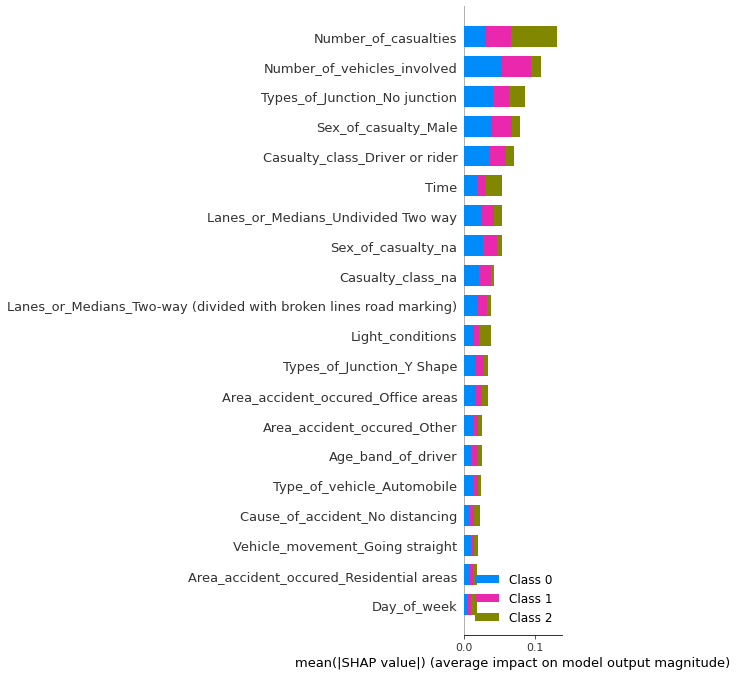

In [ ]:
shap.summary_plot(shap_values, sample_data, plot_type="bar")

In [ ]:
shap.initjs()
shap.force_plot(shap.TreeExplainer(final_model_RFC).expected_value[0], shap_values[0][:], sample_data)

In [ ]:
print(final_model_RFC.predict(sample_data)[49])
shap.initjs()
shap.force_plot(shap.TreeExplainer(final_model_RFC).expected_value[0], shap_values[1][10], sample_data.iloc[10])

0.0


In [ ]:
i=13
shap.initjs()
print(final_model_RFC.predict(sample_data)[i])
shap.force_plot(shap.TreeExplainer(final_model_RFC).expected_value[0], shap_values[0][i], sample_data.values[i], feature_names = sample_data.columns)

0.0


***

# Feature Importance

In [ ]:
feature_importance_df = pd.DataFrame()
feature_importance_df['feature_name'] = X_train_smote.columns.values
feature_importance_df['feature_importance_value'] = final_model.feature_importances_
feature_importance_df.sort_values(by='feature_importance_value',inplace=True)
fig = px.bar( x=feature_importance_df['feature_name'], y=feature_importance_df['feature_importance_value'] )
fig.update_layout( height=1000 )
fig.show()

In [ ]:
feature_importance_df = feature_importance_df[feature_importance_df['feature_importance_value'] >= 0.01]
X_train_smote_top = X_train_smote[feature_importance_df['feature_name']]
X_test_top = X_test[feature_importance_df['feature_name']]

In [ ]:
X_train_smote_top.columns.values

array(['Casualty_class_Pedestrian',
       'Type_of_collision_Vehicle with vehicle collision',
       'Sex_of_casualty_Female', 'Age_band_of_casualty',
       'Area_accident_occured_Residential areas',
       'Vehicle_movement_Going straight',
       'Type_of_collision_Collision with pedestrians',
       'Service_year_of_vehicle', 'Cause_of_accident_No distancing',
       'Driving_experience', 'Types_of_Junction_Y Shape',
       'Educational_level', 'Area_accident_occured_Other',
       'Type_of_vehicle_Automobile', 'Casualty_class_na',
       'Age_band_of_driver', 'Area_accident_occured_Office areas',
       'Lanes_or_Medians_Two-way (divided with broken lines road marking)',
       'Sex_of_casualty_na', 'Light_conditions', 'Day_of_week',
       'Lanes_or_Medians_Undivided Two way',
       'Casualty_class_Driver or rider', 'Sex_of_casualty_Male',
       'Types_of_Junction_No junction', 'Number_of_vehicles_involved',
       'Time', 'Number_of_casualties'], dtype=object)

In [ ]:
Data=pd.read_csv('gdrive/My Drive/TMLC Guided Projects/Project_1/RTA Dataset.csv')

In [ ]:
top_feature_final = ['Type_of_collision', 'Age_band_of_casualty', 'Sex_of_casualty', 'Casualty_class', 'Vehicle_movement', 'Types_of_Junction',
       'Service_year_of_vehicle', 'Cause_of_accident', 'Driving_experience', 'Educational_level', 'Type_of_vehicle', 'Age_band_of_driver',
       'Area_accident_occured', 'Lanes_or_Medians',  'Day_of_week', 'Light_conditions', 'Time', 'Number_of_vehicles_involved', 'Number_of_casualties']

Data = Data[top_feature_final]
Data

,Type_of_collision,Age_band_of_casualty,Sex_of_casualty,Casualty_class,Vehicle_movement,Types_of_Junction,Service_year_of_vehicle,Cause_of_accident,Driving_experience,Educational_level,Type_of_vehicle,Age_band_of_driver,Area_accident_occured,Lanes_or_Medians,Day_of_week,Light_conditions,Time,Number_of_vehicles_involved,Number_of_casualties
0,Collision with roadside-parked vehicles,na,na,na,Going straight,No junction,Above 10yr,Moving Backward,1-2yr,Above high school,Automobile,18-30,Residential areas,NaN,Monday,Daylight,17:02:00,2,2
1,Vehicle with vehicle collision,na,na,na,Going straight,No junction,5-10yrs,Overtaking,Above 10yr,Junior high school,Public (> 45 seats),31-50,Office areas,Undivided Two way,Monday,Daylight,17:02:00,2,2
2,Collision with roadside objects,31-50,Male,Driver or rider,Going straight,No junction,NaN,Changing lane to the left,1-2yr,Junior high school,Lorry (41?100Q),18-30,Recreational areas,other,Monday,Daylight,17:02:00,2,2
3,Vehicle with vehicle collision,18-30,Female,Pedestrian,Going straight,Y Shape,NaN,Changing lane to the right,5-10yr,Junior high school,Public (> 45 seats),18-30,Office areas,other,Sunday,Darkness - lights lit,1:06:00,2,2
4,Vehicle with vehicle collision,na,na,na,Going straight,Y Shape,5-10yrs,Overtaking,2-5yr,Junior high school,NaN,18-30,Industrial areas,other,Sunday,Darkness - lights lit,1:06:00,2,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12311,Vehicle with vehicle collision,na,na,na,Going straight,No junction,NaN,No distancing,2-5yr,NaN,Lorry (11?40Q),31-50,Outside rural areas,Undivided Two way,Wednesday,Daylight,16:15:00,2,1
12312,Vehicle with vehicle collision,na,na,na,Other,No junction,NaN,No distancing,5-10yr,Elementary school,Automobile,Unknown,Outside rural areas,Two-way (divided with broken lines road marking),Sunday,Daylight,18:00:00,2,1
12313,Vehicle with vehicle collision,31-50,Male,Driver or rider,Other,No junction,2-5yrs,Changing lane to the right,5-10yr,Junior high school,Bajaj,Over 51,Outside rural areas,Two-way (divided with broken lines road marking),Sunday,Daylight,13:55:00,1,1
12314,Vehicle with vehicle collision,na,na,na,Other,No junction,2-5yrs,Driving under the influence of drugs,Above 10yr,Junior high school,Lorry (41?100Q),18-30,Office areas,Undivided Two way,Sunday,Darkness - lights lit,13:55:00,2,1


In [ ]:
top_feature_final_nominal = list(set(nominal_feature_names).intersection(top_feature_final))
top_feature_final_numerical = list(set(numerical_feature_name).intersection(top_feature_final))
top_feature_final_numerical

['Number_of_casualties', 'Number_of_vehicles_involved']

In [ ]:
top_feature_final = ['Type_of_collision', 'Age_band_of_casualty', 'Sex_of_casualty', 'Casualty_class', 'Vehicle_movement', 'Types_of_Junction',
       'Service_year_of_vehicle', 'Cause_of_accident', 'Driving_experience', 'Educational_level', 'Type_of_vehicle', 'Age_band_of_driver',
       'Area_accident_occured', 'Lanes_or_Medians',  'Day_of_week', 'Light_conditions', 'Time', 'Number_of_vehicles_involved', 'Number_of_casualties']

def convert_Time_into_minutes(df):
  temp_df = df['Time'].str.split(":",expand=True)
  temp_df.rename( columns={0:'hour',1:'minutes',2:'seconds'}, inplace=True )
  temp_df = temp_df.astype(int)
  return temp_df['hour']*60 + temp_df['minutes']
Data['Time'] = convert_Time_into_minutes(Data)

Data['Age_band_of_driver'].replace(to_replace=['Unknown','unknown'], value=np.nan, inplace=True )
Data['Educational_level'].replace(to_replace=['Unknown','unknown'], value=np.nan, inplace=True )
Data['Driving_experience'].replace(to_replace=['Unknown','unknown'], value=np.nan, inplace=True )
Data['Service_year_of_vehicle'].replace(to_replace=['Unknown','unknown'], value=np.nan, inplace=True )
Data['Age_band_of_casualty'].replace(to_replace=['na'], value=np.nan, inplace=True )
Data['Area_accident_occured'].replace(to_replace=['Unknown','unknown'], value=np.nan, inplace=True )
Data['Lanes_or_Medians'].replace(to_replace=['Unknown','unknown'], value=np.nan, inplace=True )
Data['Types_of_Junction'].replace(to_replace=['Unknown','unknown'], value=np.nan, inplace=True )
Data['Type_of_collision'].replace(to_replace=['Unknown','unknown'], value=np.nan, inplace=True )


Data['Age_band_of_driver'] = SI_Age_band_of_driver.transform( Data[['Age_band_of_driver']] )
Data['Educational_level'] = SI_Educational_level.transform( Data[['Educational_level']] )
Data['Driving_experience'] = SI_Driving_experience.transform( Data[['Driving_experience']] )

Data['Day_of_week'] = ore_Day_of_week.transform( Data[['Day_of_week']] )
Data['Age_band_of_driver'] = ore_Age_band_of_driver.transform( Data[['Age_band_of_driver']] )
Data['Educational_level'] = ore_Educational_level.transform( Data[['Educational_level']] )
Data['Driving_experience'] = ore_Driving_experience.transform( Data[['Driving_experience']] )
Data['Light_conditions'] = ore_Light_conditions.transform( Data[['Light_conditions']] )
Data['Service_year_of_vehicle'] = ore_Service_year_of_vehicle.transform( Data[['Service_year_of_vehicle']] )
Data['Age_band_of_casualty'] = ore_Age_band_of_casualty.transform( Data[['Age_band_of_casualty']] )

Data['Area_accident_occured'] = SI_Area_accident_occured.transform( Data[['Area_accident_occured']] )
Data['Cause_of_accident'] = SI_Cause_of_accident.transform( Data[['Cause_of_accident']] )
Data['Lanes_or_Medians'] = SI_Lanes_or_Medians.transform( Data[['Lanes_or_Medians']] )
Data['Type_of_collision'] = SI_Type_of_collision.transform( Data[['Type_of_collision']] )
Data['Type_of_vehicle'] = SI_Type_of_vehicle.transform( Data[['Type_of_vehicle']] )
Data['Types_of_Junction'] = SI_Types_of_Junction.transform( Data[['Types_of_Junction']] )
Data['Vehicle_movement'] = SI_Vehicle_movement.transform( Data[['Vehicle_movement']] )

In [ ]:
one_hot_encoder_top = OneHotEncoder(variables=top_feature_final_nominal, drop_last=False)
one_hot_encoder_top.fit(Data)
Data = one_hot_encoder_top.transform( Data )

In [ ]:
Data

,Age_band_of_casualty,Service_year_of_vehicle,Driving_experience,Educational_level,Age_band_of_driver,Day_of_week,Light_conditions,Time,Number_of_vehicles_involved,Number_of_casualties,Lanes_or_Medians_Two-way (divided with broken lines road marking),Lanes_or_Medians_Undivided Two way,Lanes_or_Medians_other,Lanes_or_Medians_Double carriageway (median),Lanes_or_Medians_One way,Lanes_or_Medians_Two-way (divided with solid lines road marking),Types_of_Junction_No junction,Types_of_Junction_Y Shape,Types_of_Junction_Crossing,Types_of_Junction_O Shape,Types_of_Junction_Other,Types_of_Junction_T Shape,Types_of_Junction_X Shape,Area_accident_occured_Residential areas,Area_accident_occured_Office areas,Area_accident_occured_ Recreational areas,Area_accident_occured_ Industrial areas,Area_accident_occured_Other,Area_accident_occured_ Church areas,Area_accident_occured_ Market areas,Area_accident_occured_Rural village areas,Area_accident_occured_ Outside rural areas,Area_accident_occured_ Hospital areas,Area_accident_occured_School areas,Area_accident_occured_Rural village areasOffice areas,Area_accident_occured_Recreational areas,Casualty_class_na,Casualty_class_Driver or rider,Casualty_class_Pedestrian,Casualty_class_Passenger,Cause_of_accident_Moving Backward,Cause_of_accident_Overtaking,Cause_of_accident_Changing lane to the left,Cause_of_accident_Changing lane to the right,Cause_of_accident_Overloading,Cause_of_accident_Other,Cause_of_accident_No priority to vehicle,Cause_of_accident_No priority to pedestrian,Cause_of_accident_No distancing,Cause_of_accident_Getting off the vehicle improperly,Cause_of_accident_Improper parking,Cause_of_accident_Overspeed,Cause_of_accident_Driving carelessly,Cause_of_accident_Driving at high speed,Cause_of_accident_Driving to the left,Cause_of_accident_Unknown,Cause_of_accident_Overturning,Cause_of_accident_Turnover,Cause_of_accident_Driving under the influence of drugs,Cause_of_accident_Drunk driving,Type_of_vehicle_Automobile,Type_of_vehicle_Public (> 45 seats),Type_of_vehicle_Lorry (41?100Q),Type_of_vehicle_Public (13?45 seats),Type_of_vehicle_Lorry (11?40Q),Type_of_vehicle_Long lorry,Type_of_vehicle_Public (12 seats),Type_of_vehicle_Taxi,Type_of_vehicle_Pick up upto 10Q,Type_of_vehicle_Stationwagen,Type_of_vehicle_Ridden horse,Type_of_vehicle_Other,Type_of_vehicle_Bajaj,Type_of_vehicle_Turbo,Type_of_vehicle_Motorcycle,Type_of_vehicle_Special vehicle,Type_of_vehicle_Bicycle,Vehicle_movement_Going straight,Vehicle_movement_U-Turn,Vehicle_movement_Moving Backward,Vehicle_movement_Turnover,Vehicle_movement_Waiting to go,Vehicle_movement_Getting off,Vehicle_movement_Reversing,Vehicle_movement_Unknown,Vehicle_movement_Parked,Vehicle_movement_Stopping,Vehicle_movement_Overtaking,Vehicle_movement_Other,Vehicle_movement_Entering a junction,Sex_of_casualty_na,Sex_of_casualty_Male,Sex_of_casualty_Female,Type_of_collision_Collision with roadside-parked vehicles,Type_of_collision_Vehicle with vehicle collision,Type_of_collision_Collision with roadside objects,Type_of_collision_Collision with animals,Type_of_collision_Other,Type_of_collision_Rollover,Type_of_collision_Fall from vehicles,Type_of_collision_Collision with pedestrians,Type_of_collision_With Train
0,NaN,4.0,2.0,5.0,1.0,1.0,3.0,1022,2,2,1,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0
1,NaN,3.0,5.0,3.0,2.0,1.0,3.0,1022,2,2,0,1,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0
2,3.0,NaN,2.0,3.0,1.0,1.0,3.0,1022,2,2,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0
3,2.0,NaN,4.0,3.0,1.0,0.0,2.0,66,2,2,0,0,1,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,

In [ ]:
X_train_top,X_test_top,y_train_top,y_test = train_test_split( Data, Data_Target, test_size=0.25, random_state=10, stratify=Data_Target )

In [ ]:
model = XGBClassifier()
imputer_RFR = IterativeImputer( estimator=model, max_iter=5, random_state=10, initial_strategy='most_frequent', skip_complete=True ) 
imputer_RFR.fit(X_train_top)
imputed = imputer_RFR.transform(X_train_top)
X_train_top = pd.DataFrame(imputed, columns=X_train_top.columns)

imputed_test = imputer_RFR.transform(X_test_top)
X_test_top = pd.DataFrame(imputed_test, columns=X_test_top.columns)

In [ ]:
smote = SMOTE()
X_train_smote_top , y_train_smote_top = smote.fit_resample( X_train_top, y_train_top )

In [ ]:
final_model = RandomForestClassifier( n_estimators=107, max_depth=20, min_samples_split=5, min_samples_leaf=3, max_features=45 )
final_model.fit( X_train_smote_top, y_train_smote )
Results = Evaluation(final_model,X_train_smote_top,X_test_top,y_train_smote,y_test,hypertuning=False)

-----------------------------------------------------------------------------------------------------------
RandomForestClassifier(max_depth=20, max_features=45, min_samples_leaf=3,
                       min_samples_split=5, n_estimators=107)
 For Train Set :  
F1_Score =  0.9608463875552269
              precision    recall  f1-score   support

         0.0       0.90      1.00      0.95      7811
         1.0       1.00      0.89      0.94      7811
         2.0       1.00      0.99      0.99      7811

    accuracy                           0.96     23433
   macro avg       0.96      0.96      0.96     23433
weighted avg       0.96      0.96      0.96     23433

 For Test Set :  
F1_Score =  0.7876969200294665
              precision    recall  f1-score   support

         0.0       0.85      1.00      0.92      2604
         1.0       0.76      0.04      0.08       436
         2.0       0.00      0.00      0.00        39

    accuracy                           0.85      3079
   m

<Figure size 864x432 with 0 Axes>

In [ ]:
list_objects = { 
        'SI_Age_band_of_driver':SI_Age_band_of_driver, 'SI_Educational_level':SI_Educational_level, 'SI_Driving_experience':SI_Driving_experience,  
        'ore_Day_of_week':ore_Day_of_week, 'ore_Age_band_of_driver':ore_Age_band_of_driver, 'ore_Educational_level':ore_Educational_level, 'ore_Driving_experience':ore_Driving_experience,
         'ore_Light_conditions':ore_Light_conditions, 'ore_Service_year_of_vehicle':ore_Service_year_of_vehicle,
        'ore_Age_band_of_casualty':ore_Age_band_of_casualty,
        'SI_Area_accident_occured':SI_Area_accident_occured, 'SI_Cause_of_accident':SI_Cause_of_accident, 'SI_Lanes_or_Medians':SI_Lanes_or_Medians,
        'SI_Type_of_collision':SI_Type_of_collision, 'SI_Type_of_vehicle':SI_Type_of_vehicle, 'SI_Types_of_Junction':SI_Types_of_Junction, 'SI_Vehicle_movement':SI_Vehicle_movement,
        'one_hot_encoder_top':one_hot_encoder_top,
        'final_model':final_model
         }

In [ ]:
import joblib
joblib.dump(list_objects, "model_RFC_top.dat")

['model_RFC_top.dat']

In [ ]:
loaded_model = joblib.load("model_RFC_top.dat")

In [ ]:
loaded_model

{'SI_Age_band_of_driver': SimpleImputer(strategy='most_frequent'),
 'SI_Area_accident_occured': SimpleImputer(strategy='most_frequent'),
 'SI_Cause_of_accident': SimpleImputer(strategy='most_frequent'),
 'SI_Driving_experience': SimpleImputer(strategy='most_frequent'),
 'SI_Educational_level': SimpleImputer(strategy='most_frequent'),
 'SI_Lanes_or_Medians': SimpleImputer(strategy='most_frequent'),
 'SI_Type_of_collision': SimpleImputer(strategy='most_frequent'),
 'SI_Type_of_vehicle': SimpleImputer(strategy='most_frequent'),
 'SI_Types_of_Junction': SimpleImputer(strategy='most_frequent'),
 'SI_Vehicle_movement': SimpleImputer(strategy='most_frequent'),
 'final_model': RandomForestClassifier(max_depth=20, max_features=45, min_samples_leaf=3,
                        min_samples_split=5, n_estimators=107),
 'one_hot_encoder_top': OneHotEncoder(variables=['Lanes_or_Medians', 'Types_of_Junction',
                          'Area_accident_occured', 'Casualty_class',
                         

In [ ]:
final_model_RFC = loaded_model['final_model']
final_model_RFC

RandomForestClassifier(max_depth=20, max_features=45, min_samples_leaf=3,
                       min_samples_split=5, n_estimators=107)

In [ ]:
sample_data = X_train_smote_top.sample(20)

In [ ]:
shap_values = shap.TreeExplainer(final_model_RFC).shap_values(sample_data)

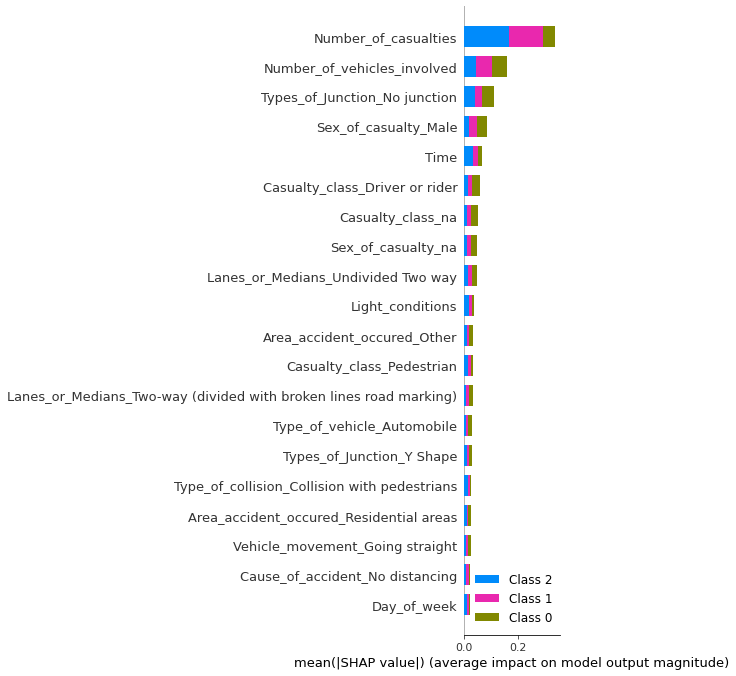

In [ ]:
shap.summary_plot(shap_values, sample_data, plot_type="bar")

In [ ]:
shap.initjs()
shap.force_plot(shap.TreeExplainer(final_model_RFC).expected_value[0], shap_values[0][:], sample_data)

In [ ]:
print(final_model_RFC.predict(sample_data)[12])
shap.initjs()
shap.force_plot(shap.TreeExplainer(final_model_RFC).expected_value[0], shap_values[1][10], sample_data.iloc[10])

0.0


In [ ]:
i=5
shap.initjs()
print(final_model_RFC.predict(sample_data)[i])
shap.force_plot(shap.TreeExplainer(final_model_RFC).expected_value[0], shap_values[0][i], sample_data.values[i], feature_names = sample_data.columns)

2.0
